In [1282]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

df=pd.read_csv('Dirty_Global_Music_Streaming_Listener_Preferences.csv')

# Flow of Code

### Refer readme.md for that :)


* File is so big, because I have plotted so many graphs (for every possible combinations) to understand the data better (although many graphs are not very informative).
* In report I will summarize the results of the only informative graphs.
* Also it may take 30-100 seconds to run the code, because I have done so many operations on the data to get better results.




# Reading Data


In [1283]:
print("Dataset Overview:")
df.head()

Dataset Overview:


,User_ID,Age,Country,Streaming Platform,Top Genre,Minutes Streamed Per Day,Number of Songs Liked,Most Played Artist,Subscription Type,Listening Time (Morning/Afternoon/Night),Discover Weekly Engagement (%),Repeat Song Rate (%)
0,U2501,44,Australia,Amazon Music,Rock,568,309,Taylor Swift,Premium,Morning,54.45,37.37
1,U3586,30,South Korea,Amazon Music,Pop,430,408,Drake,Premium,Afternoon,59.27,75.36
2,U3653,25,India,Spotify,Hip-Hop,403,268,The Weeknd,Premium,Morning,58.69,11.68
3,U2055,47,Australia,Spotify,Classical,586,137,The Weeknd,Free,Afternoon,48.38,68.58
4,U1705,28,Brazil,Amazon Music,Rock,54,943,Ed Sheeran,Premium,Morning,59.97,38.64


In [1284]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 12 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   User_ID                                   980 non-null    object 
 1   Age                                       1000 non-null   int64  
 2   Country                                   966 non-null    object 
 3   Streaming Platform                        985 non-null    object 
 4   Top Genre                                 985 non-null    object 
 5   Minutes Streamed Per Day                  1000 non-null   int64  
 6   Number of Songs Liked                     1000 non-null   int64  
 7   Most Played Artist                        985 non-null    object 
 8   Subscription Type                         965 non-null    object 
 9   Listening Time (Morning/Afternoon/Night)  1000 non-null   object 
 10  Discover Weekly Engagement (%)       

In [1285]:
print("Stats : ")
df.describe()

Stats : 


,Age,Minutes Streamed Per Day,Number of Songs Liked,Discover Weekly Engagement (%)
count,1000.00000,1000.000000,1000.000000,980.000000
mean,37.99500,369.408000,251.891000,51.880806
std,34.31286,1610.739414,154.420325,38.706056
min,-10.00000,-500.000000,1.000000,-50.000000
25%,25.00000,156.750000,116.500000,30.422500
50%,37.00000,318.000000,249.000000,51.085000
75%,49.00000,461.500000,380.000000,70.350000
max,999.00000,50000.000000,943.000000,999.000000


# Data Cleaning



Missing Values Before Cleaning:
User_ID                                     20
Age                                          0
Country                                     34
Streaming Platform                          15
Top Genre                                   15
Minutes Streamed Per Day                     0
Number of Songs Liked                        0
Most Played Artist                          15
Subscription Type                           35
Listening Time (Morning/Afternoon/Night)     0
Discover Weekly Engagement (%)              20
Repeat Song Rate (%)                         1
dtype: int64


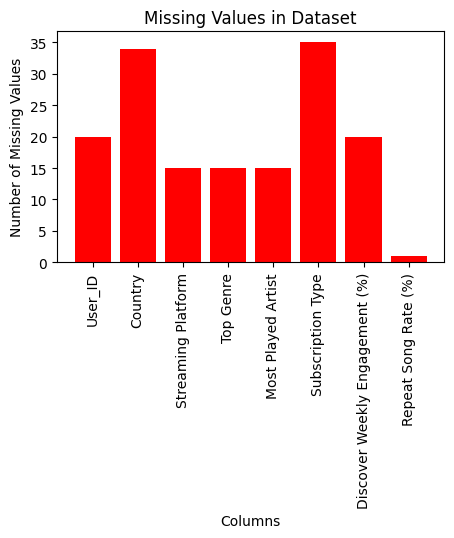

In [1286]:
print("\nMissing Values Before Cleaning:")
print(df.isnull().sum())

plt.figure(figsize=(5, 3))
missing_values = df.isnull().sum()
missing_values = missing_values[missing_values > 0]
plt.bar(missing_values.index, missing_values.values, color='red')
plt.xlabel("Columns")
plt.ylabel("Number of Missing Values")
plt.title("Missing Values in Dataset")
plt.xticks(rotation=90)
plt.show()

#### Remove invalid data

In [1287]:

df = df[(df['Age'] > 0) & (df['Age'] < 100) & (df['Discover Weekly Engagement (%)']<100) &(df['Discover Weekly Engagement (%)']>0) & (df['Minutes Streamed Per Day']<=1440)& (df['Minutes Streamed Per Day']>0)]



#### Replace invaldid data in case of ListenTime with Night

In [1288]:
print("\nBefore Cleaning:")
print(df['Listening Time (Morning/Afternoon/Night)'].value_counts())

# if some value is not in the list, it will be replaced with 'Morning'

df['Listening Time (Morning/Afternoon/Night)'] = df['Listening Time (Morning/Afternoon/Night)'].apply(lambda x: x if x in ['Morning', 'Afternoon', 'Night'] else 'Morning')

print("After Cleaning:")
print(df['Listening Time (Morning/Afternoon/Night)'].value_counts())



Before Cleaning:
Listening Time (Morning/Afternoon/Night)
Night        324
Afternoon    319
Morning      317
Midnight       1
123            1
XYZ            1
Noon           1
?              1
Name: count, dtype: int64
After Cleaning:
Listening Time (Morning/Afternoon/Night)
Night        324
Morning      322
Afternoon    319
Name: count, dtype: int64


### Basic NaN handling (drop/replacement)

In [1289]:
#Remove rows with missing values in 'User_ID' column
#Fill missing values in 'Country' column with mode value : Because it is a categorical column
df = df.dropna(subset=['User_ID'])
df['Country'] = df['Country'].fillna(df['Country'].mode()[0])

print("\nMissing Values After Cleaning:")
print(df.isnull().sum())




Missing Values After Cleaning:
User_ID                                      0
Age                                          0
Country                                      0
Streaming Platform                          14
Top Genre                                   15
Minutes Streamed Per Day                     0
Number of Songs Liked                        0
Most Played Artist                          14
Subscription Type                           32
Listening Time (Morning/Afternoon/Night)     0
Discover Weekly Engagement (%)               0
Repeat Song Rate (%)                         0
dtype: int64


#### Advanced NaN handling (Grouping & replace with mean) - Numerical Data

In [1290]:
# Now, for other columns , it doesn't make sense to fill missing values with mean or mode because they are categorical columns
# So , I am grouping them based on country and age group and then filling missing values with mode of that group
# Create Age Group column
bins = [0, 18, 25, 35, 45, 55, 65, 100]
labels = ['0-18', '19-25', '26-35', '36-45', '46-55', '56-65', '65+']

def age_group(age):
    for i in range(7):
        if age <= bins[i+1]:
            return labels[i]
        
df['Age Group'] = df['Age'].apply(age_group)



# For Discover Weekly Engagement (%) column : replace missing values with the mean of the column but within same country, same genre and similar age group
# We have to do this much because there are 20 missing values in this column and we can't simply replace them with the mean of the column
def fill_na_discover_weekly_engagement(row):
    if pd.isnull(row['Discover Weekly Engagement (%)']):
        return df[(df['Country'] == row['Country'])  & (df['Age Group'] == row['Age Group'])]['Discover Weekly Engagement (%)'].mean()
    else:
        return row['Discover Weekly Engagement (%)']

df['Discover Weekly Engagement (%)'] = df.apply(fill_na_discover_weekly_engagement, axis=1)


# In Repeat Song rate column, make them all numeric first, because column is object type
# Now replace simply with the mean of the column because only one value is missing.
df['Repeat Song Rate (%)'] = pd.to_numeric(df['Repeat Song Rate (%)'], errors='coerce')
df['Repeat Song Rate (%)'] = df['Repeat Song Rate (%)'].fillna(df['Repeat Song Rate (%)'].mean())

# Remove invalid data for Repeat Song Rate column
df = df[(df['Repeat Song Rate (%)'] >= 0) & (df['Repeat Song Rate (%)'] <= 100)]


##### NaN handling for Categorical Data (Grouping & replace with mode) -> More Logical to group by some other column

In [1291]:
# Do same for Streaming platform, Top genre columns and subscription type as of Discover Weekly Engagement column

def fill_na_mode(row, column):
    mode_value = df[(df['Country'] == row['Country']) & (df['Age Group'] == row['Age Group'])][column].mode()
    if mode_value.empty:
        mode_value = df[(df['Country'] == row['Country'])][column].mode()
    if pd.isnull(row[column]):
        if not mode_value.empty:
            return mode_value[0]
        else:
            return df[column].mode()[0]  
    else:
        return row[column]

df['Streaming Platform'] = df.apply(lambda row: fill_na_mode(row, 'Streaming Platform'), axis=1)
df['Top Genre'] = df.apply(lambda row: fill_na_mode(row, 'Top Genre'), axis=1)
df['Subscription Type'] = df.apply(lambda row: fill_na_mode(row, 'Subscription Type'), axis=1)
df['Most Played Artist'] = df.apply(lambda row: fill_na_mode(row, 'Most Played Artist'), axis=1)

print("\nMissing Values After Cleaning:")
x = df.isnull().sum()
print(x)



Missing Values After Cleaning:
User_ID                                     0
Age                                         0
Country                                     0
Streaming Platform                          0
Top Genre                                   0
Minutes Streamed Per Day                    0
Number of Songs Liked                       0
Most Played Artist                          0
Subscription Type                           0
Listening Time (Morning/Afternoon/Night)    0
Discover Weekly Engagement (%)              0
Repeat Song Rate (%)                        0
Age Group                                   0
dtype: int64


#### Remove Duplicate Rows (Based on User_ID only)

In [1292]:
print("No. of Rows and Columns After Cleaning:")    
print(df.shape)
df.drop_duplicates(subset='User_ID', keep='first', inplace=True)
print("\nDuplicate Entries Removed.")
print("No. of Rows and Columns After Cleaning:")
print(df.shape)


No. of Rows and Columns After Cleaning:
(943, 13)

Duplicate Entries Removed.
No. of Rows and Columns After Cleaning:
(941, 13)


In [1293]:
df.info()


<class 'pandas.core.frame.DataFrame'>
Index: 941 entries, 0 to 999
Data columns (total 13 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   User_ID                                   941 non-null    object 
 1   Age                                       941 non-null    int64  
 2   Country                                   941 non-null    object 
 3   Streaming Platform                        941 non-null    object 
 4   Top Genre                                 941 non-null    object 
 5   Minutes Streamed Per Day                  941 non-null    int64  
 6   Number of Songs Liked                     941 non-null    int64  
 7   Most Played Artist                        941 non-null    object 
 8   Subscription Type                         941 non-null    object 
 9   Listening Time (Morning/Afternoon/Night)  941 non-null    object 
 10  Discover Weekly Engagement (%)            9

#### Detect and remove outliers (Numerical Data) -> Observe by plotting boxplot

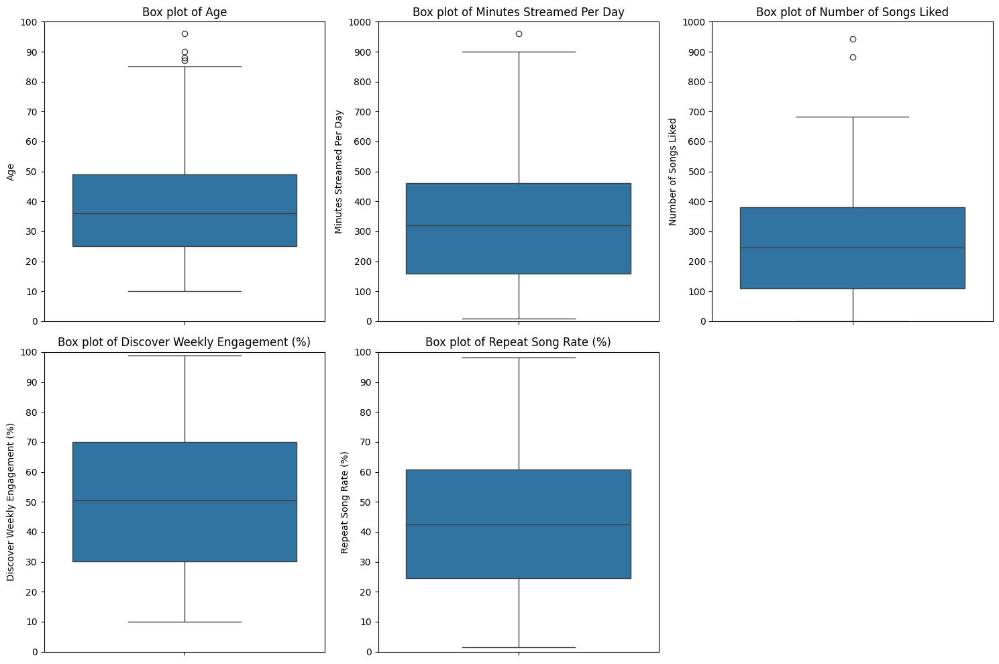

In [1294]:
# Plot box plots for numeric columns
numcols = ['Age','Minutes Streamed Per Day','Number of Songs Liked' ,'Discover Weekly Engagement (%)', 'Repeat Song Rate (%)']
plt.figure(figsize=(15, 10))

for i, col in enumerate(numcols):
    plt.subplot(2, 3, i+1)
    sns.boxplot(y=df[col])
    plt.title(f'Box plot of {col}')
    if col == 'Age' or '%' in col: 
        plt.ylim(0, 100) #Assume age and percentage columns have values between 0 and 100
        plt.yticks(np.arange(0, 101, 10)) 
    else:
        plt.ylim(0, 1000) #Assume other columns have values between 0 and 1000
        plt.yticks(np.arange(0, 1001, 100)) 

plt.tight_layout()
plt.show()

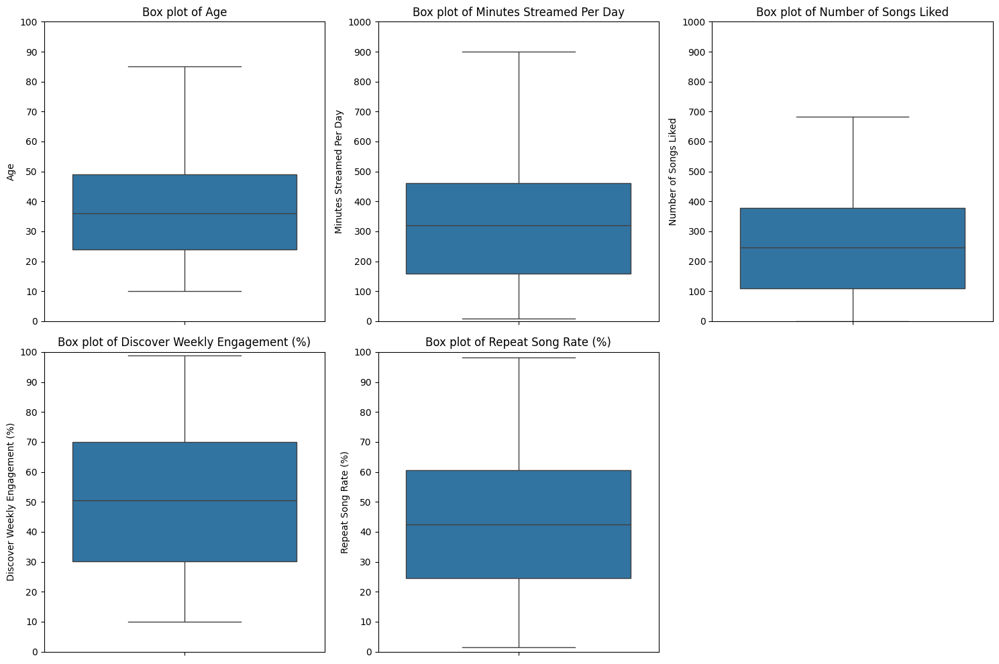

In [1295]:
#Remove outliers from each column

def remove_outliers(col):
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    return df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]

for col in numcols:
    df = remove_outliers(col)

# Plot box plots for numeric columns after removing outliers
plt.figure(figsize=(15, 10))
for i in range(len(numcols)):
    plt.subplot(2, 3, i+1)
    sns.boxplot(y=df[numcols[i]])
    plt.title(f'Box plot of {numcols[i]}')
    if numcols[i] == 'Age' or '%' in numcols[i]:
        plt.ylim(0, 100)
        plt.yticks(np.arange(0, 101, 10))
    else:
        plt.ylim(0, 1000)
        plt.yticks(np.arange(0, 1001, 100))

plt.tight_layout()
plt.show()

In [1296]:
print("Stats : ")
df.describe()

Stats : 


,Age,Minutes Streamed Per Day,Number of Songs Liked,Discover Weekly Engagement (%),Repeat Song Rate (%)
count,935.000000,935.000000,935.000000,935.000000,935.000000
mean,36.366845,312.223529,247.868449,50.591369,42.559613
std,14.106477,176.794992,151.699399,23.141784,21.444323
min,10.000000,10.000000,1.000000,10.060000,1.530000
25%,24.000000,160.000000,110.000000,30.135000,24.560000
50%,36.000000,320.000000,246.000000,50.500000,42.470000
75%,49.000000,460.500000,379.000000,69.895000,60.600000
max,85.000000,899.000000,683.000000,98.920000,98.210000


Check if there are categorical outliers -> Rare values in categorical columns

Plot bar plots for categorical columns

Also bar plots will tell us if there are any inconsistencies in the data (like spelling mistakes, etc.)

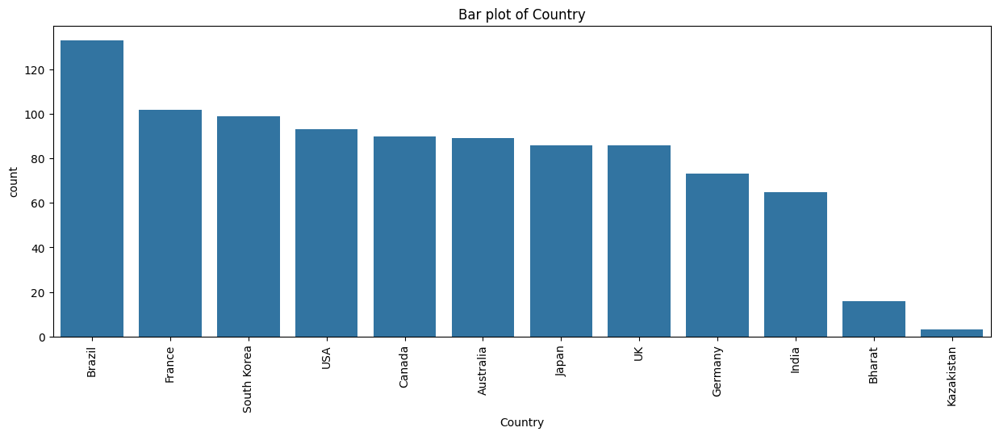

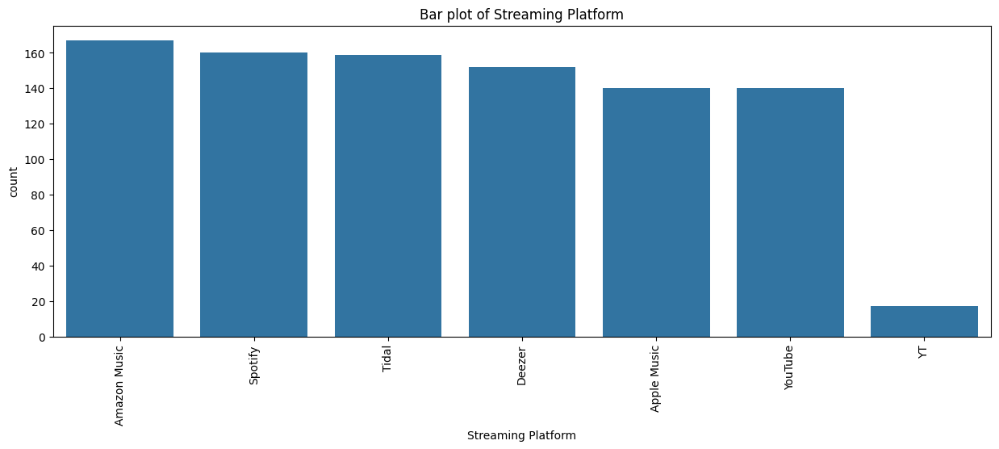

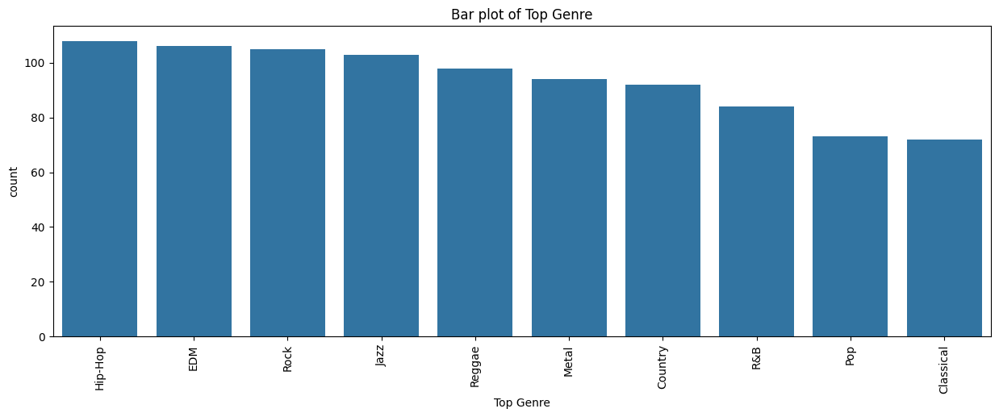

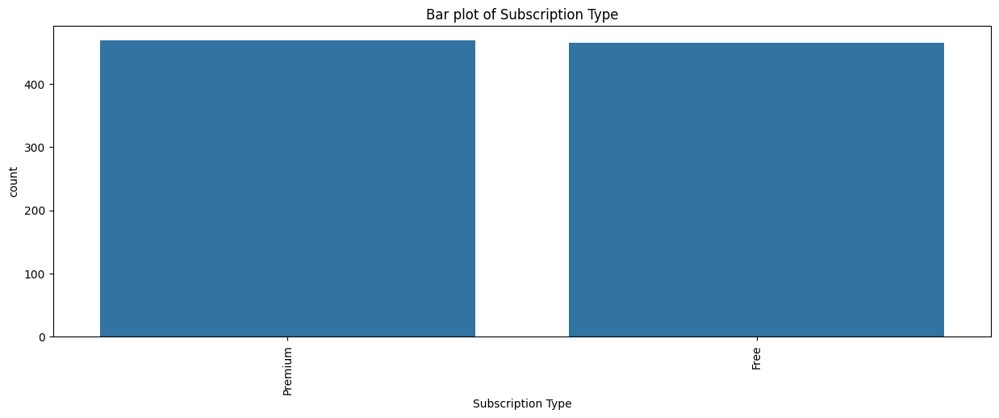

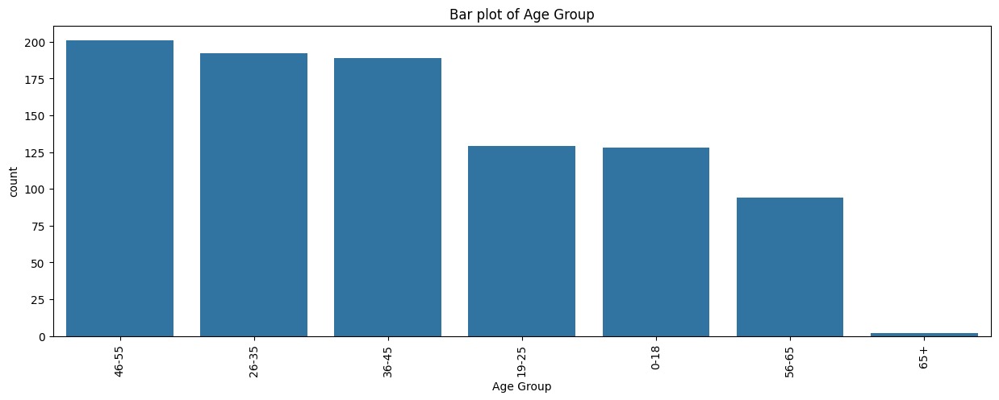

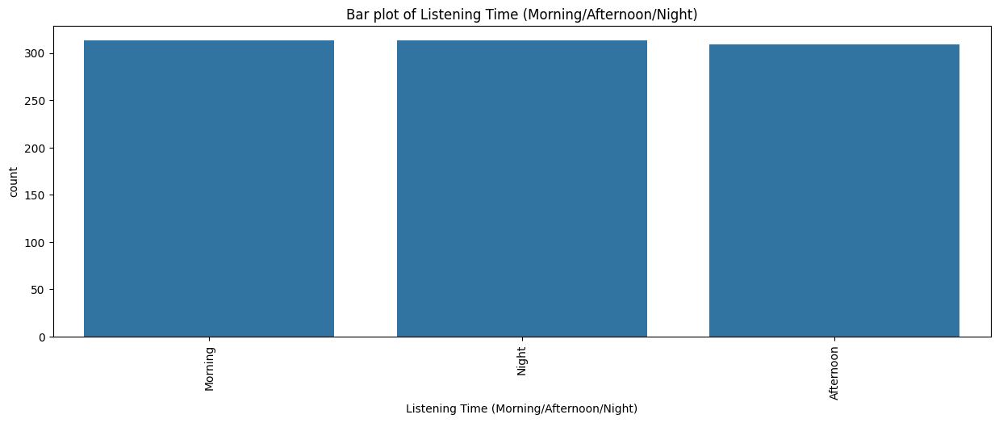

In [1297]:
df['Listening Time (Morning/Afternoon/Night)'].value_counts()
catcols = ['Country', 'Streaming Platform', 'Top Genre', 'Subscription Type', 'Age Group', 'Listening Time (Morning/Afternoon/Night)']

for col in catcols:
    plt.figure(figsize=(15, 5))
    sns.countplot(data=df, x=col, order=df[col].value_counts().index)
    plt.title(f'Bar plot of {col}')
    plt.xticks(rotation=90)
    plt.show()

Remove rare values in categorical columns -> Kazakistan and 65+ in Age Group

Manage inconsistent Bharat and India in Country column and YT and Youtube in Streaming Platform column


In [1298]:
df = df[df['Country'] != 'Kazakistan']
df = df[df['Age Group'] != '65+']


df['Country'] = df['Country'].replace('Bharat', 'India')
df['Streaming Platform'] = df['Streaming Platform'].replace('YT', 'YouTube')

# EDA

## Univariate analysis

##### For categorical columns, we can get mode, unique elements and value counts

In [1299]:
for col in catcols:
    print(f"\nSummary Statistics of {col}:")
    print(df[col].describe().to_string()) 
    print("Mode:", df[col].mode().values[0])  

    print("\nValue Counts:")
    print(df[col].value_counts().to_string())  




Summary Statistics of Country:
count        930
unique        10
top       Brazil
freq         133
Mode: Brazil

Value Counts:
Country
Brazil         133
France         102
South Korea     99
USA             93
Canada          90
Australia       88
UK              86
Japan           86
India           80
Germany         73

Summary Statistics of Streaming Platform:
count              930
unique               6
top       Amazon Music
freq               166
Mode: Amazon Music

Value Counts:
Streaming Platform
Amazon Music    166
Spotify         159
Tidal           159
YouTube         156
Deezer          151
Apple Music     139

Summary Statistics of Top Genre:
count         930
unique         10
top       Hip-Hop
freq          108
Mode: Hip-Hop

Value Counts:
Top Genre
Hip-Hop      108
EDM          106
Rock         105
Jazz         102
Reggae        98
Metal         93
Country       91
R&B           84
Pop           73
Classical     70

Summary Statistics of Subscription Type:
count    

##### For numerical columns, we can get (mean, median, mode, variance, skewness, etc.)

In [1300]:
print("Skewness of Numerical Columns:")
print(df[numcols].skew())
df.describe()

Skewness of Numerical Columns:
Age                               0.016687
Minutes Streamed Per Day         -0.013756
Number of Songs Liked             0.079779
Discover Weekly Engagement (%)    0.000770
Repeat Song Rate (%)              0.006595
dtype: float64


,Age,Minutes Streamed Per Day,Number of Songs Liked,Discover Weekly Engagement (%),Repeat Song Rate (%)
count,930.000000,930.000000,930.000000,930.000000,930.000000
mean,36.235484,312.159140,248.180645,50.631742,42.515783
std,13.957394,177.040813,151.748019,23.117866,21.425213
min,10.000000,10.000000,1.000000,10.060000,1.530000
25%,24.000000,160.000000,110.250000,30.182500,24.545000
50%,36.000000,320.000000,246.000000,50.685000,42.465000
75%,48.000000,460.750000,379.000000,69.897500,60.457500
max,60.000000,899.000000,683.000000,98.920000,98.210000


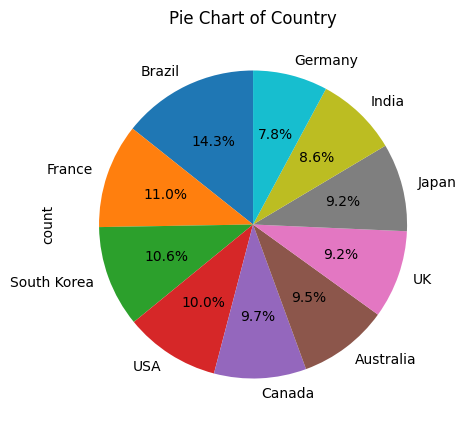

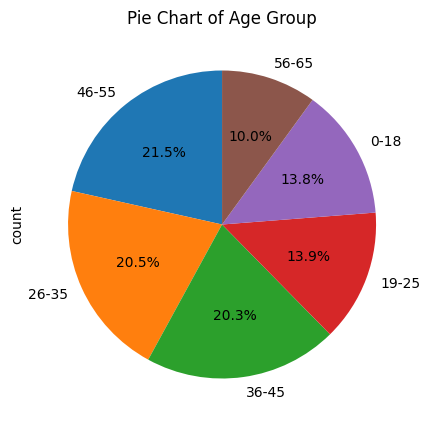

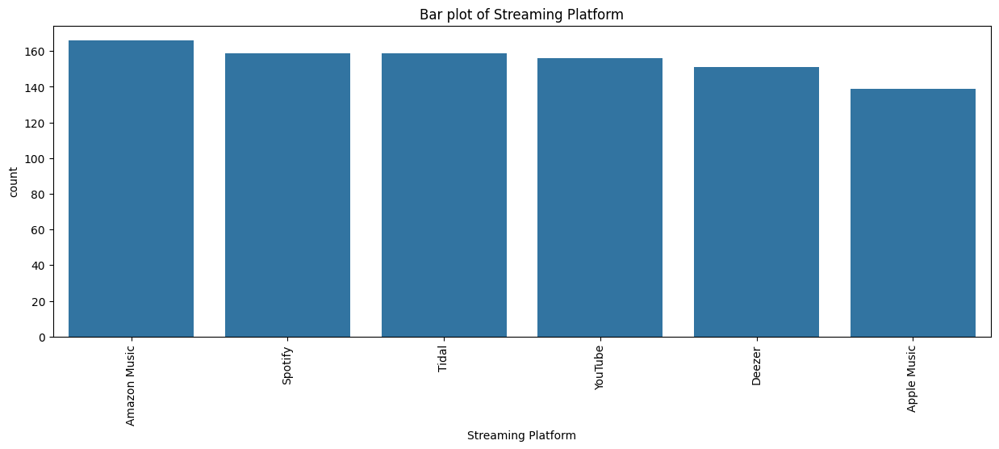

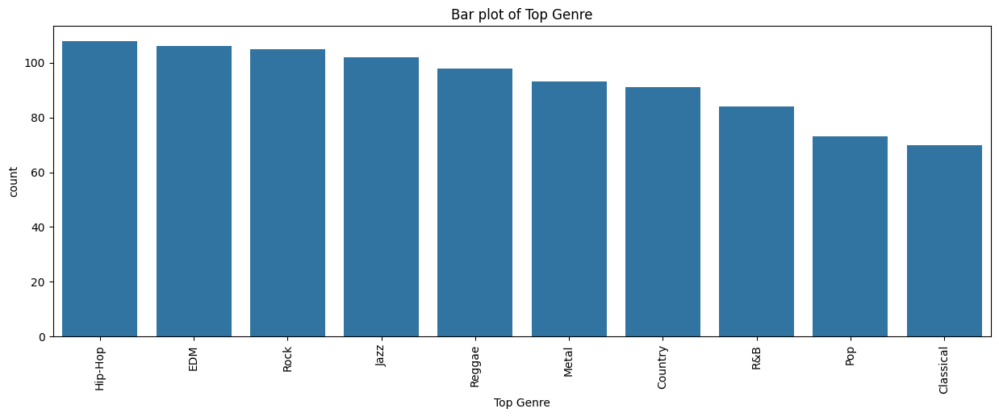

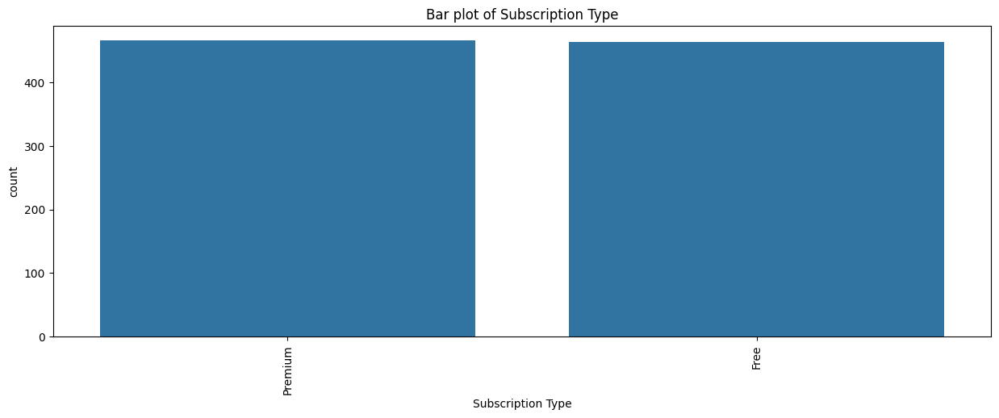

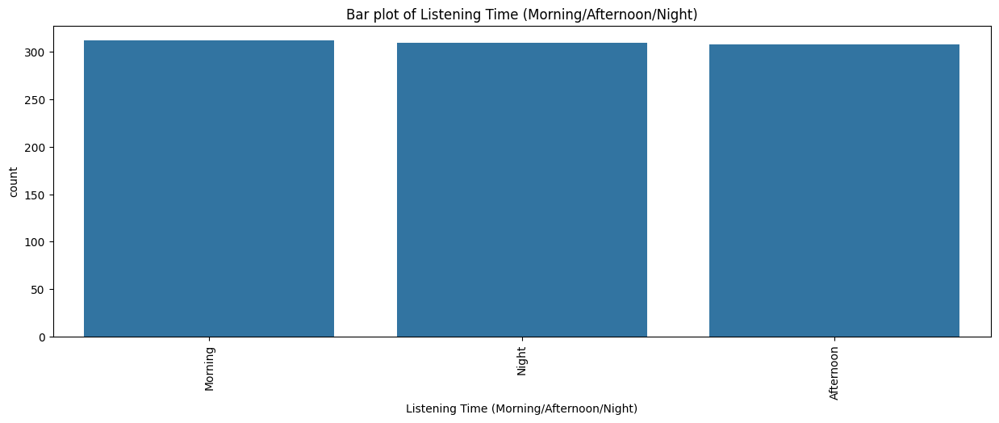

In [1301]:
# Pie chart for Country column
plt.figure(figsize=(5, 5))
df['Country'].value_counts().plot.pie(autopct='%1.1f%%', startangle=90)
plt.title('Pie Chart of Country')
plt.show()

# Pie chart for Age Group column
plt.figure(figsize=(5, 5))
df['Age Group'].value_counts().plot.pie(autopct='%1.1f%%', startangle=90)
plt.title('Pie Chart of Age Group')
plt.show()

# Frequency distributions for categorical variables.
for col in catcols:
    if col == 'Country' or col == 'Age Group':
        continue

    plt.figure(figsize=(15, 5))
    sns.countplot(data=df, x=col, order=df[col].value_counts().index)
    plt.title(f'Bar plot of {col}')
    plt.xticks(rotation=90)
    plt.show()



#### Histograms for numerical columns

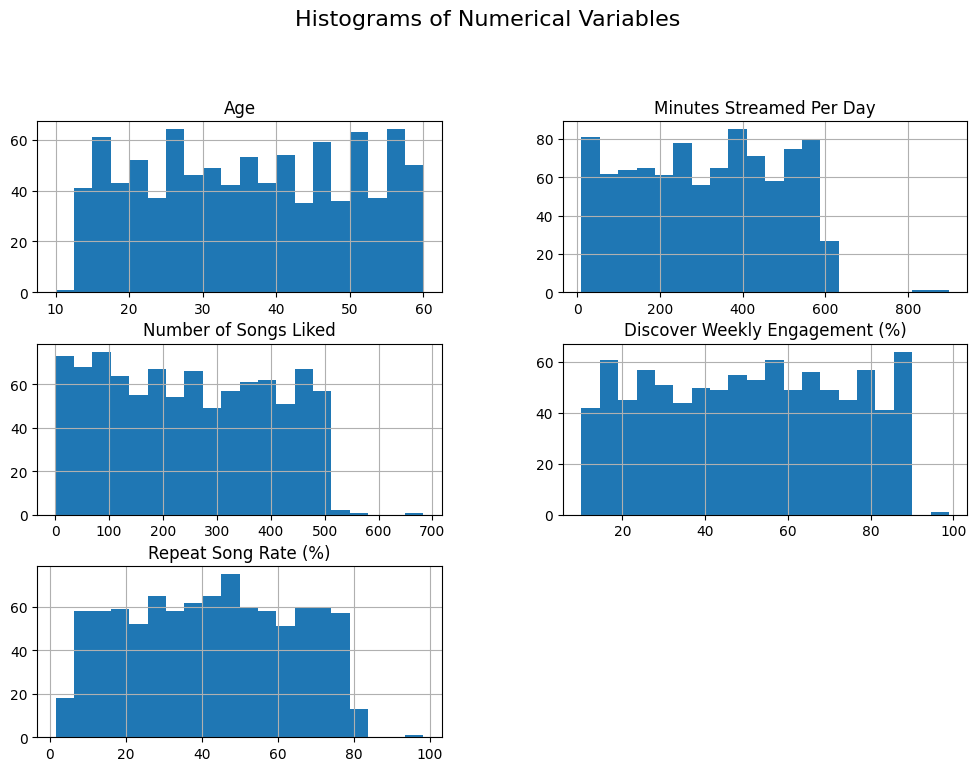

In [1302]:
df.hist(figsize=(12, 8), bins=20)
plt.suptitle("Histograms of Numerical Variables", y=1.02, size=16)
plt.show()



#### Final Boxplots

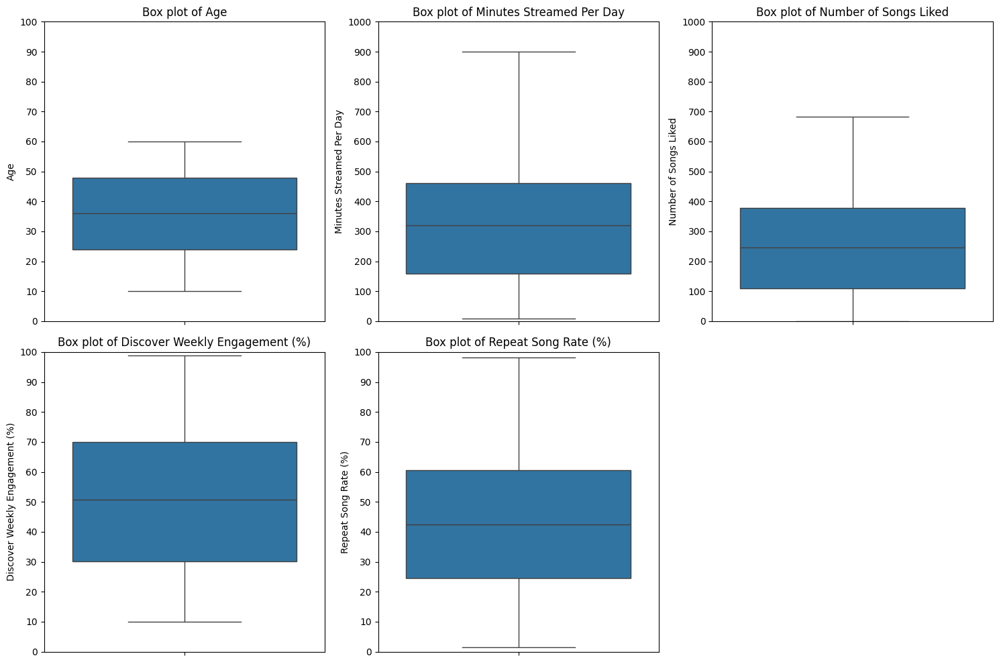

In [1303]:
plt.figure(figsize=(15, 10))
for i in range(len(numcols)):
    plt.subplot(2, 3, i+1)
    sns.boxplot(y=df[numcols[i]])
    plt.title(f'Box plot of {numcols[i]}')
    if numcols[i] == 'Age' or '%' in numcols[i]:
        plt.ylim(0, 100)
        plt.yticks(np.arange(0, 101, 10))
    else:
        plt.ylim(0, 1000)
        plt.yticks(np.arange(0, 1001, 100))

plt.tight_layout()
plt.show()

## Bivariate analysis

#### Correlation Matrix for numerical columns
###### So plot for every pair of numerical columns differently

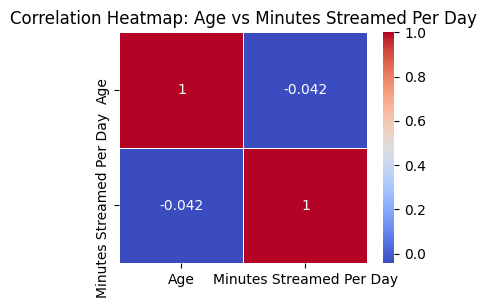

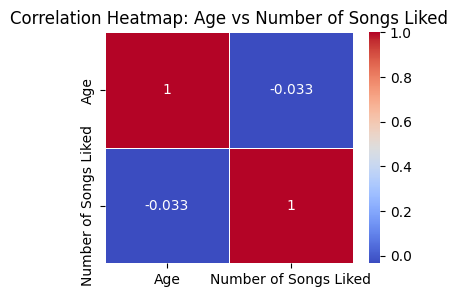

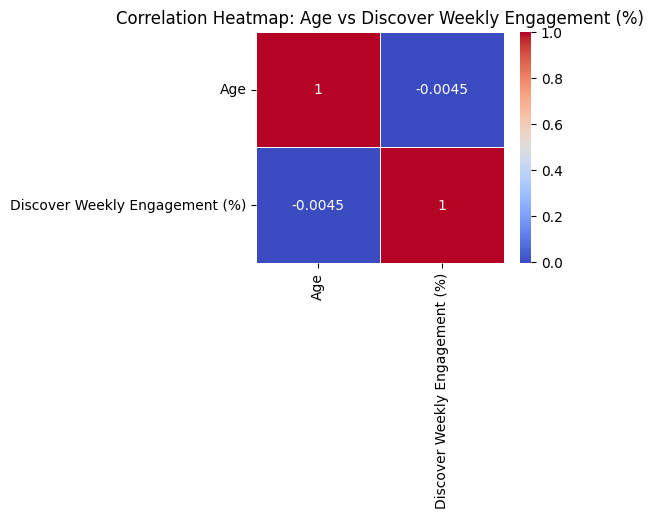

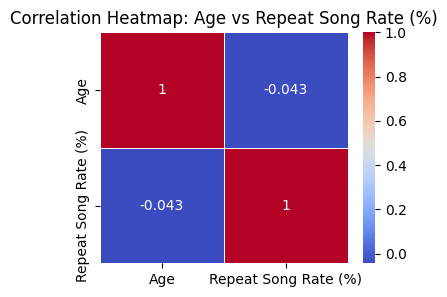

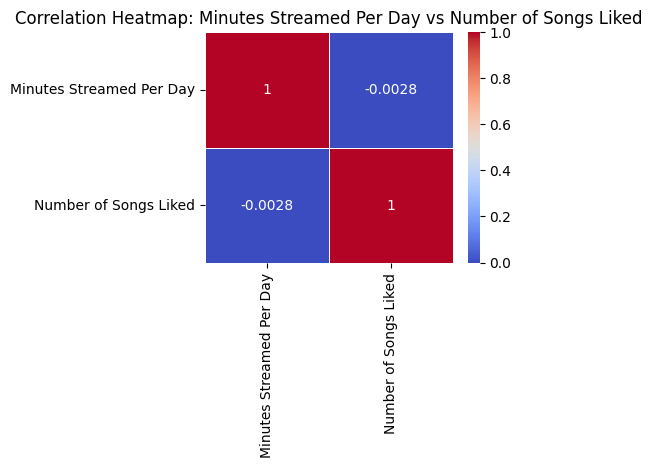

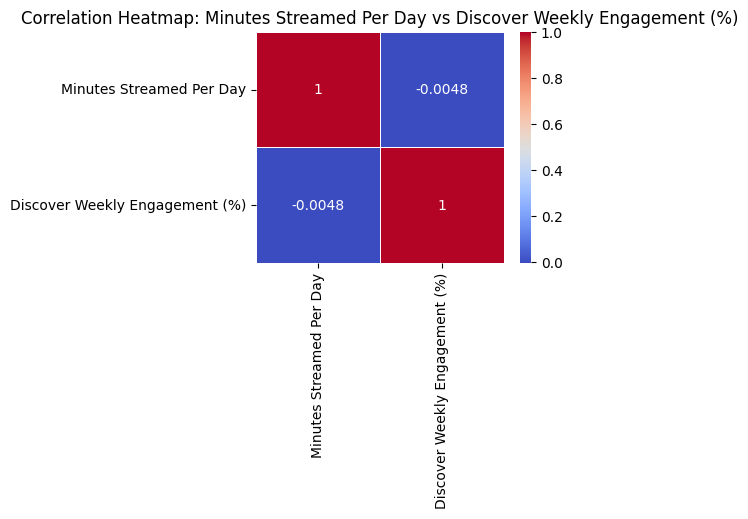

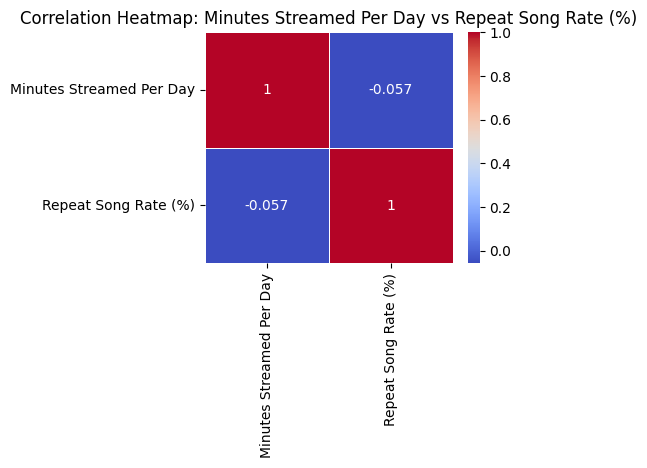

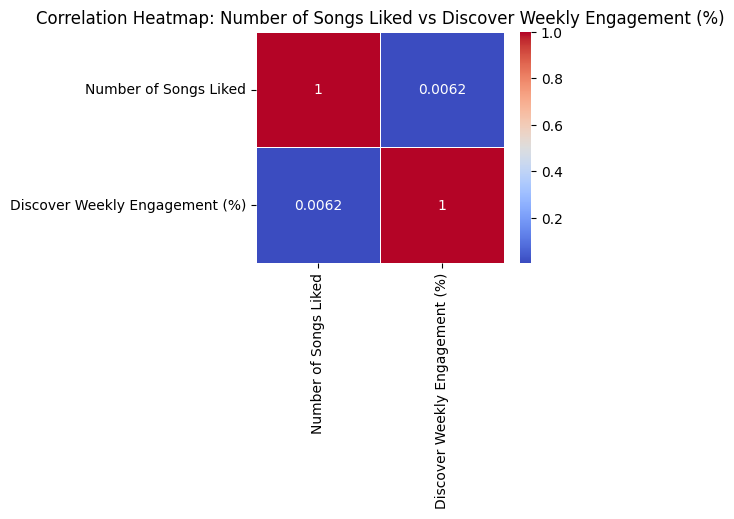

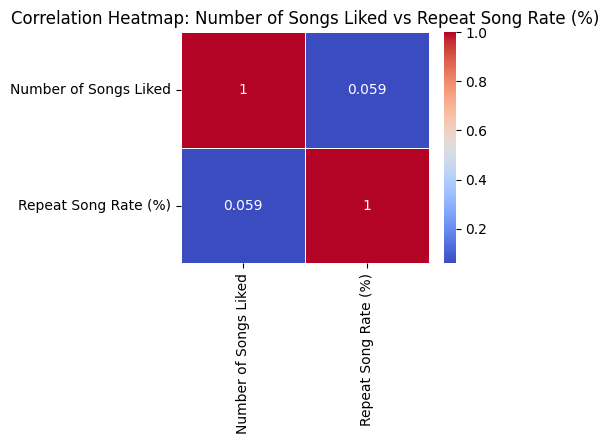

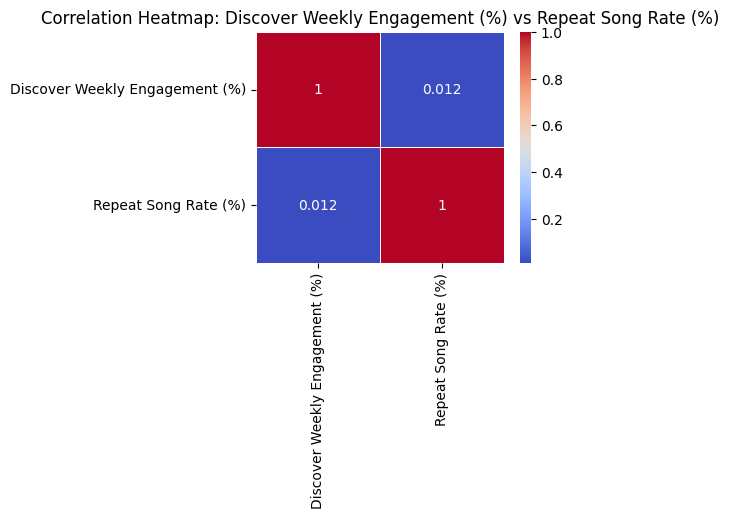

In [1304]:

for i, col1 in enumerate(numcols):
    for j, col2 in enumerate(numcols):
       if i < j:
            plt.figure(figsize=(4, 3))
            corr_matrix = df[[col1, col2]].corr()
            sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
            plt.title(f"Correlation Heatmap: {col1} vs {col2}")
            plt.show()


#### Scatter plots for numerical columns

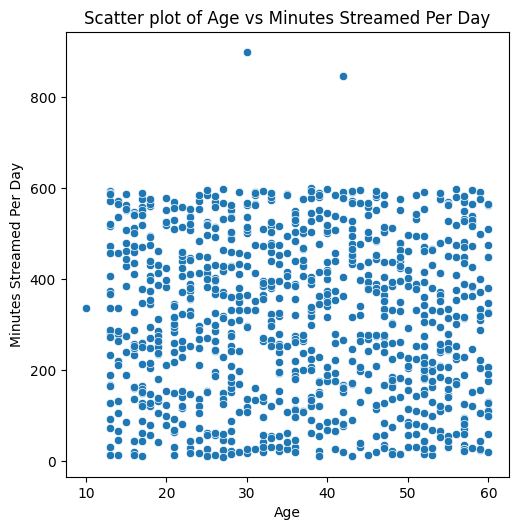

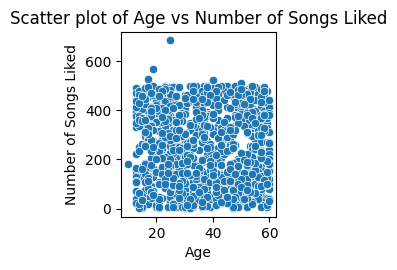

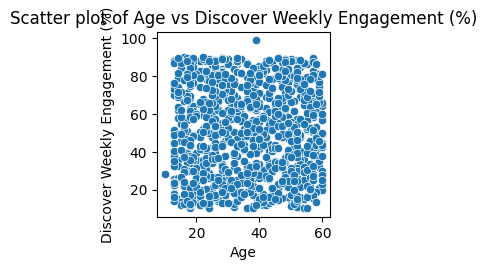

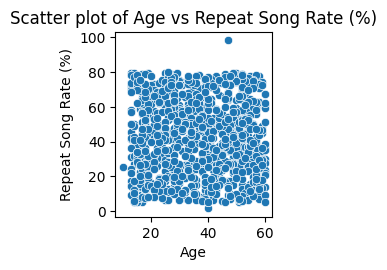

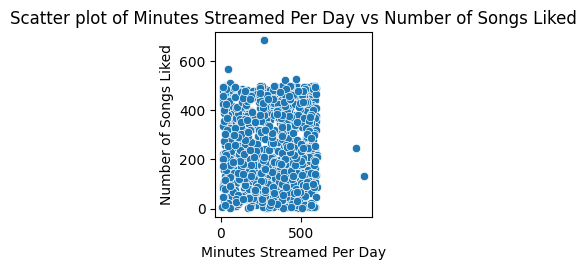

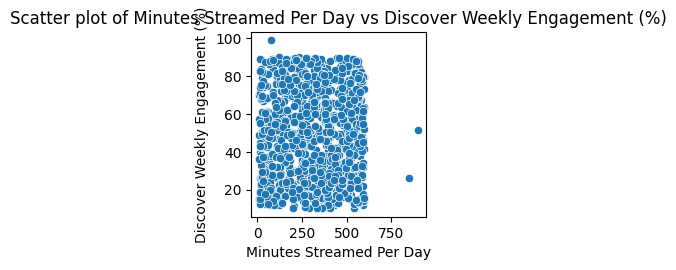

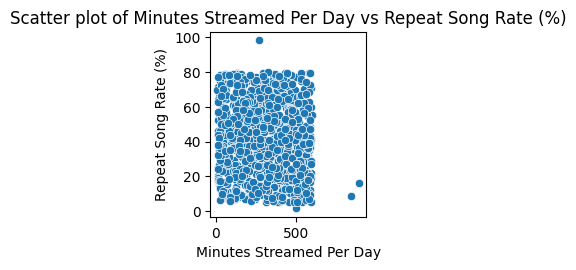

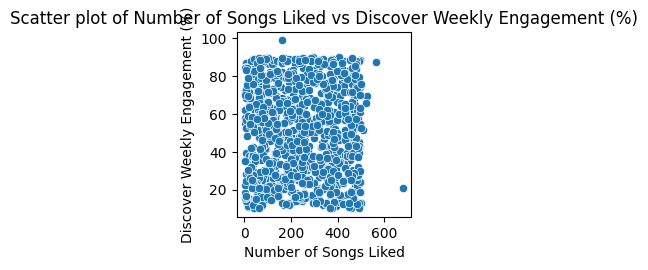

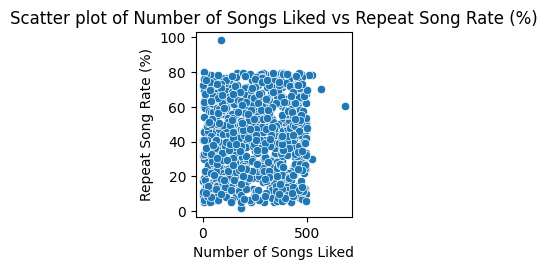

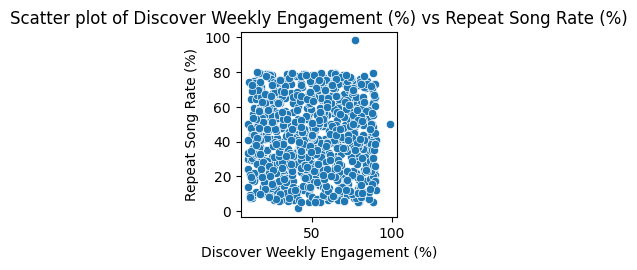

In [1305]:
plt.figure(figsize=(15, 10))

for i, col1 in enumerate(numcols):
    for j, col2 in enumerate(numcols):
        if i < j:
            plt.subplot(2, 3, j+1)
            sns.scatterplot(data=df, x=col1, y=col2)
            plt.title(f'Scatter plot of {col1} vs {col2}')
            plt.tight_layout()
            plt.show()


#### Violon Plots (Categorical columns vs Numerical columns)

<Figure size 1500x1000 with 0 Axes>

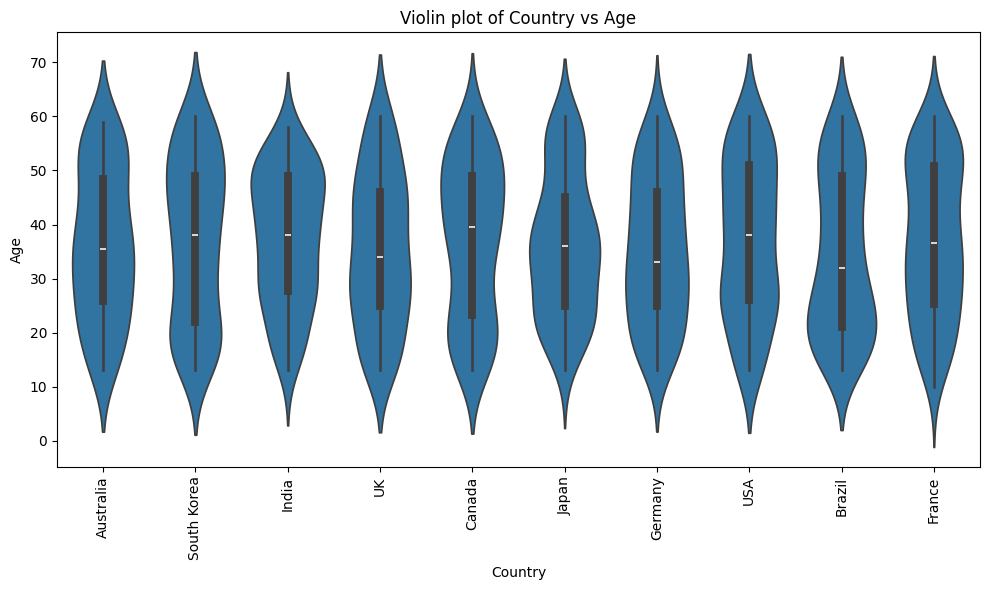

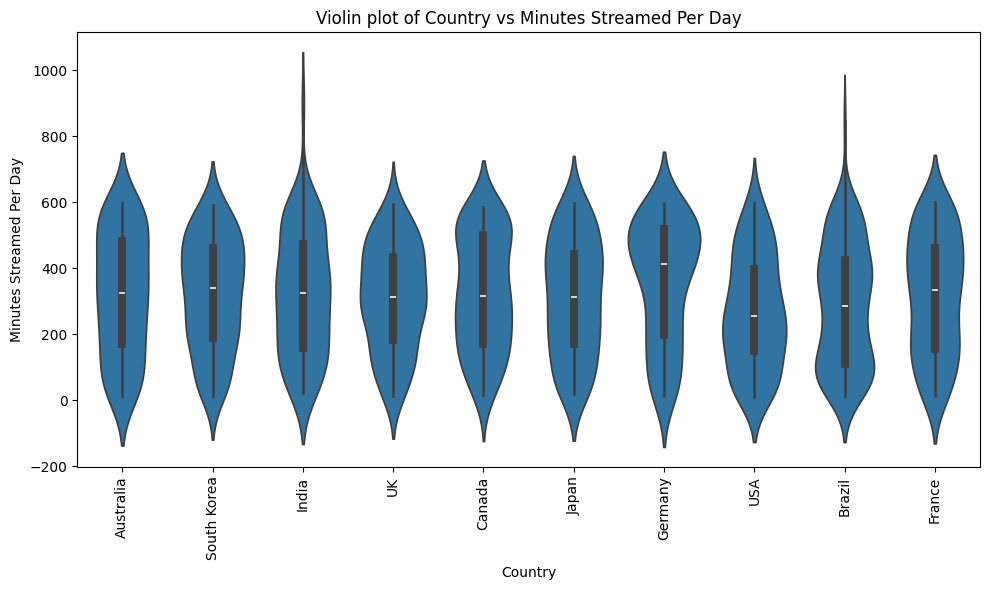

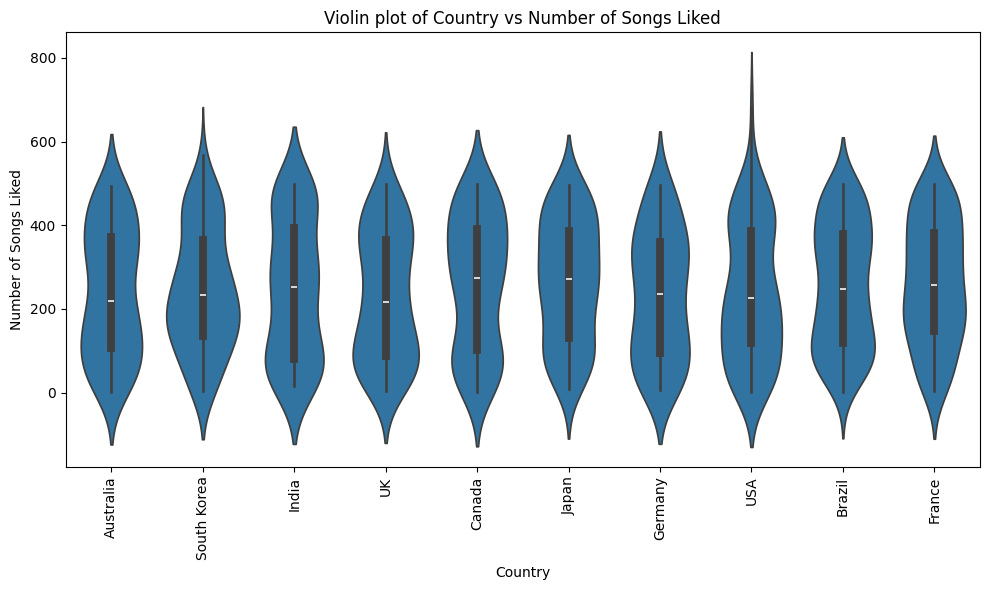

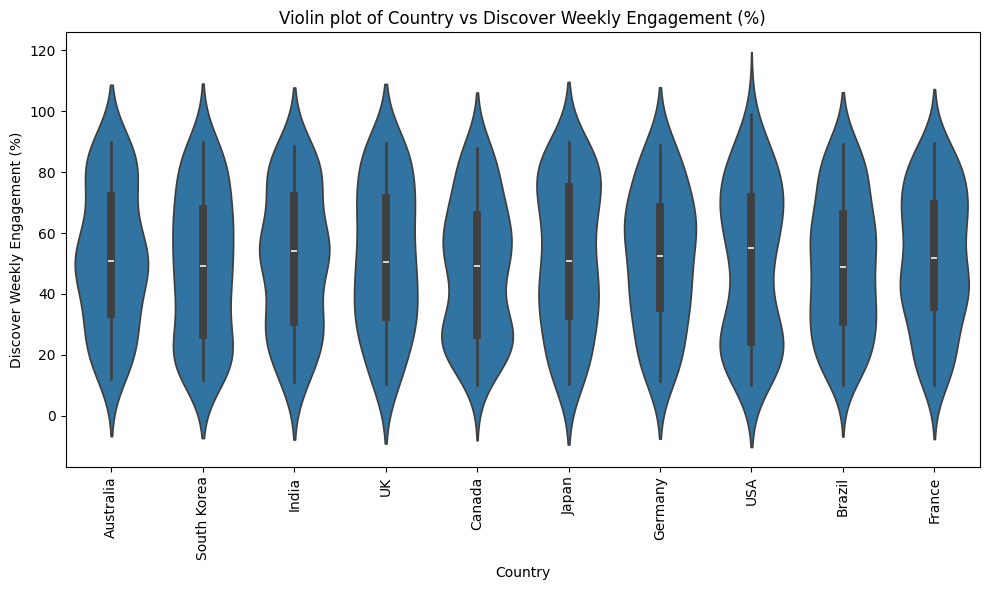

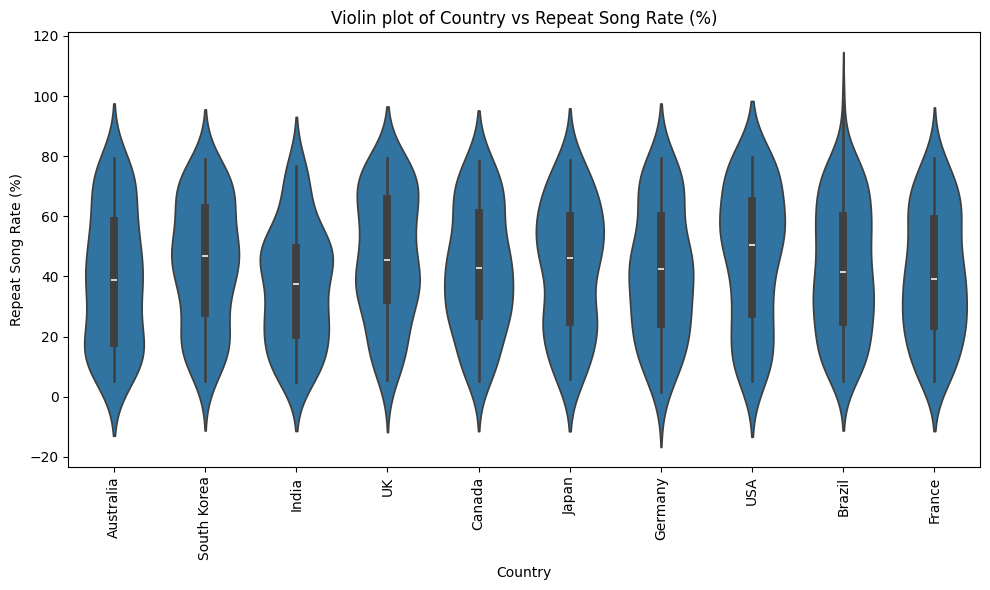

...

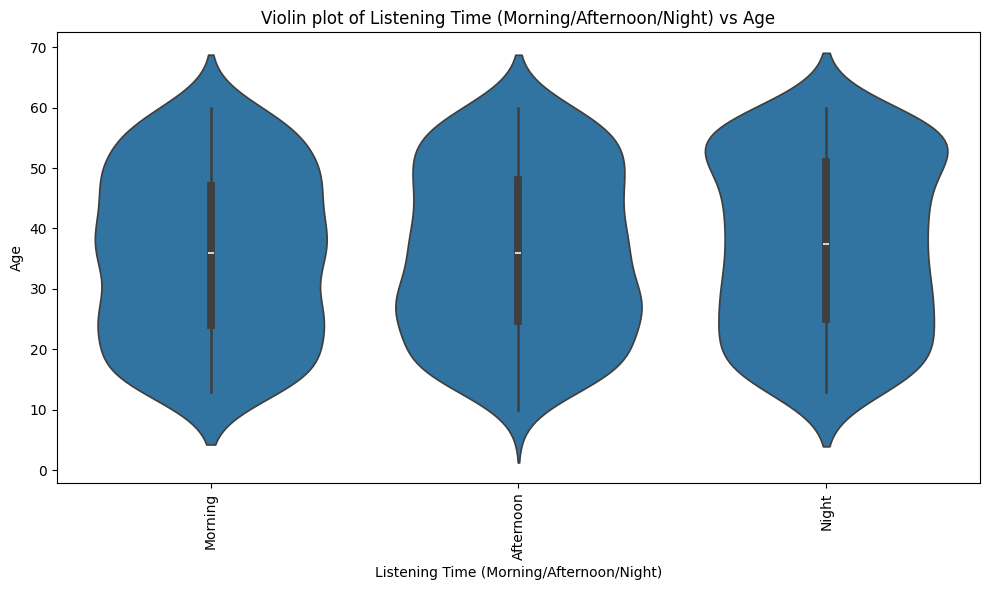

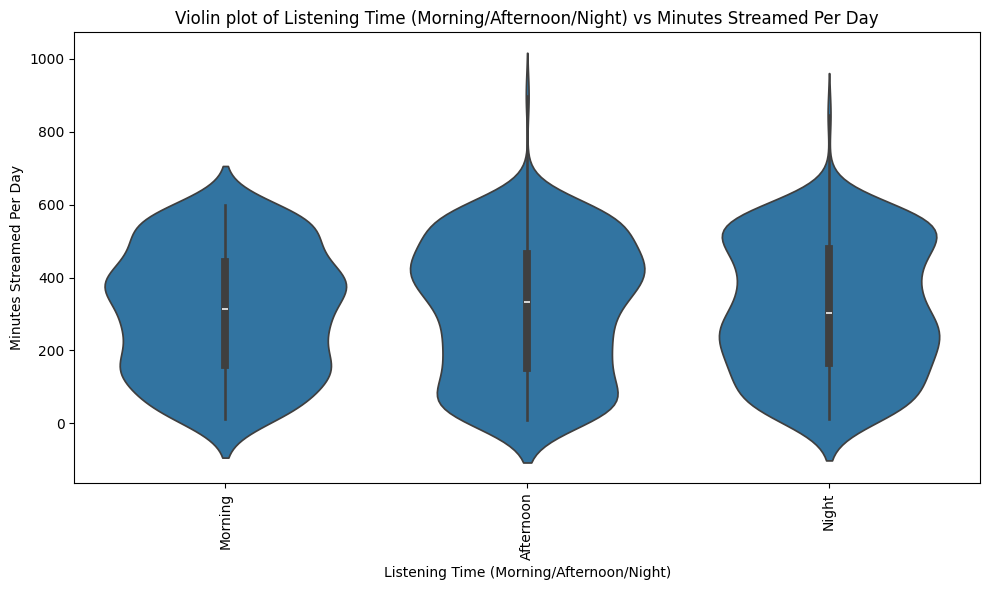

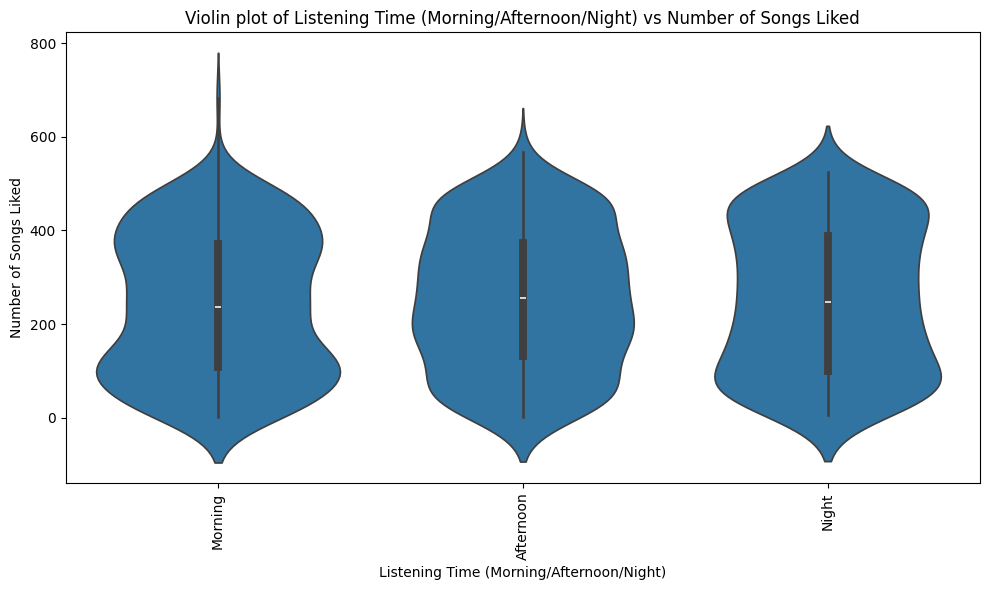

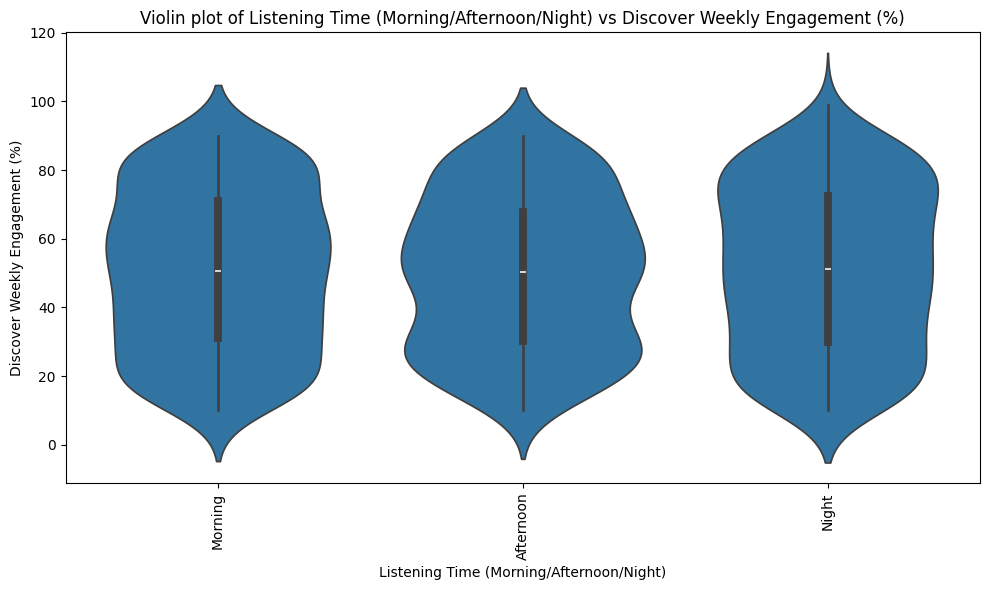

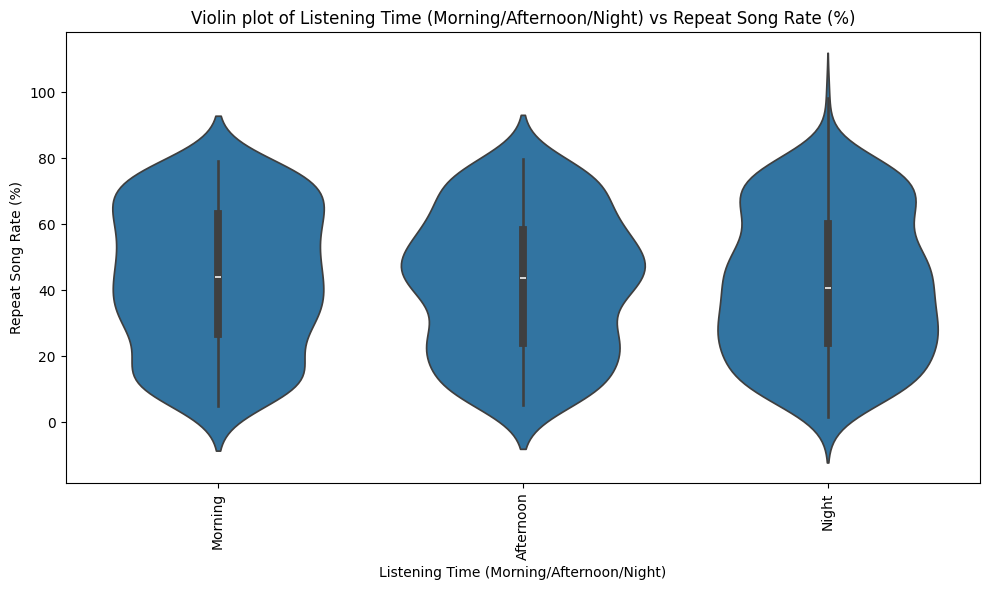

In [1306]:
plt.figure(figsize=(15, 10))
for i, col1 in enumerate(catcols):
    for j, col2 in enumerate(numcols):
        plt.figure(figsize=(10, 6))
        sns.violinplot(data=df, x=col1, y=col2)
        plt.title(f'Violin plot of {col1} vs {col2}')
        plt.xticks(rotation=90)
        plt.tight_layout()
        plt.show()



### Boxplot (for Numerical vs. Categorical Data)

<Figure size 1500x1000 with 0 Axes>

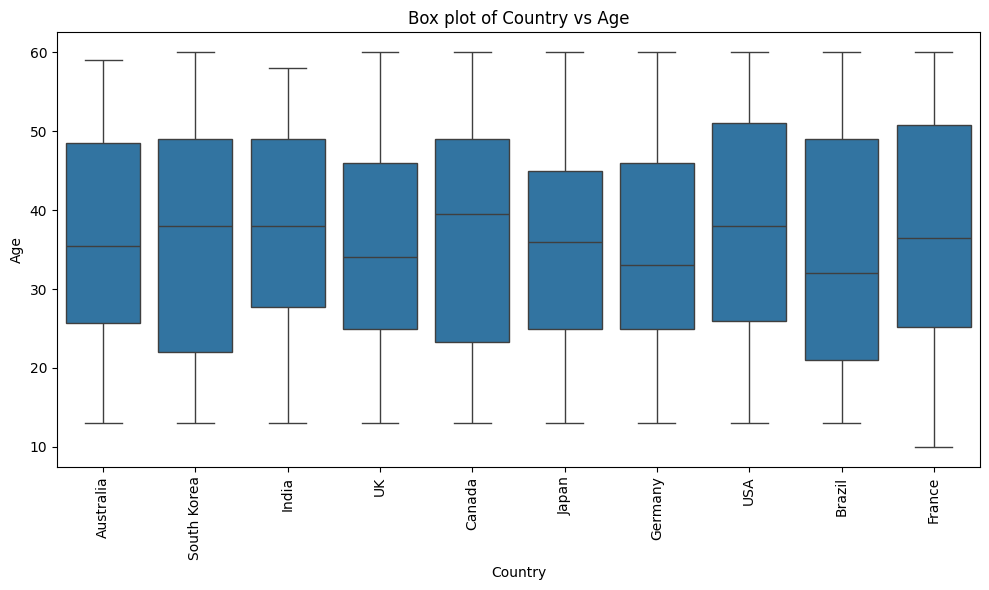

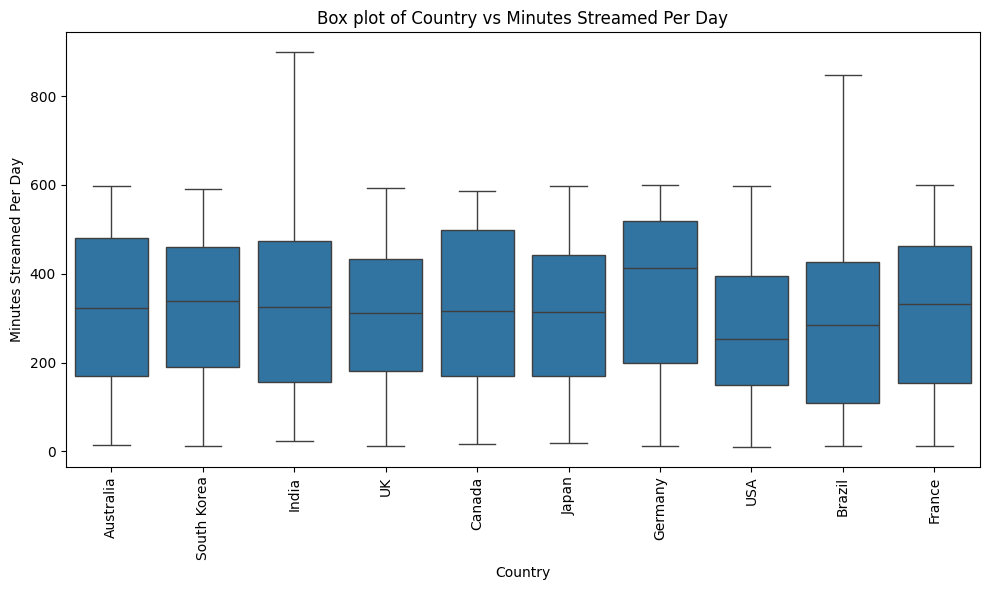

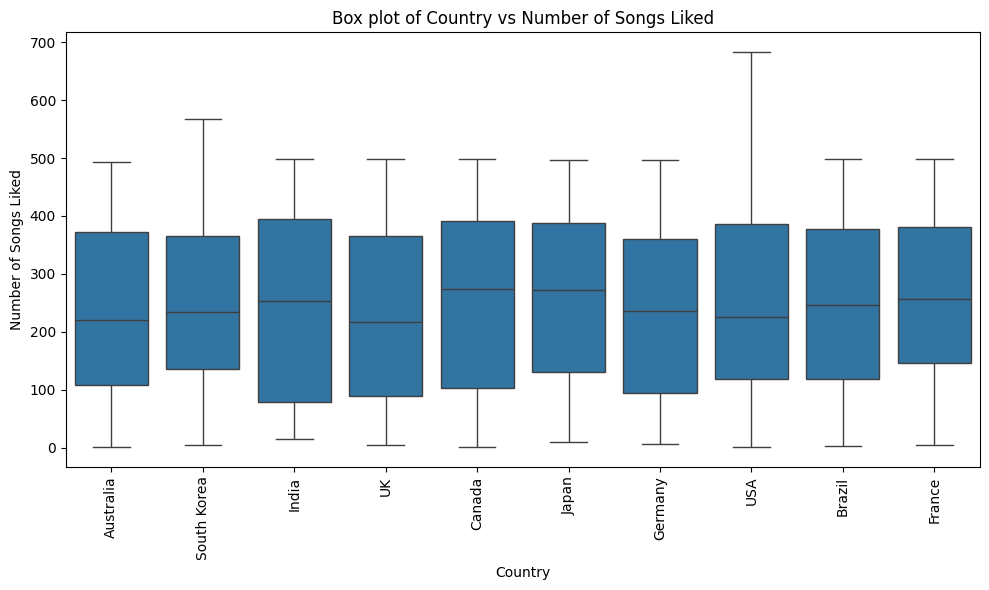

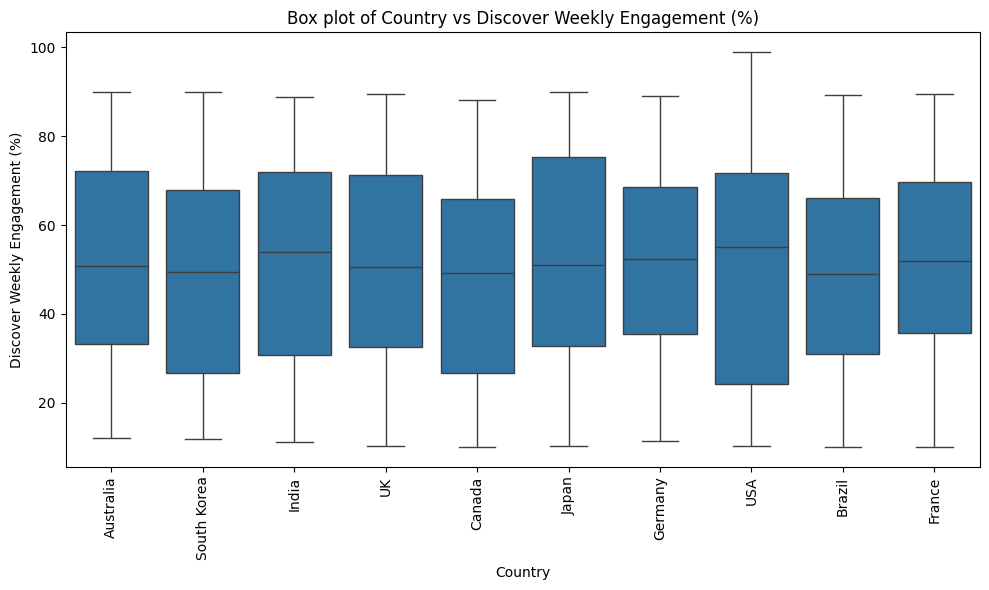

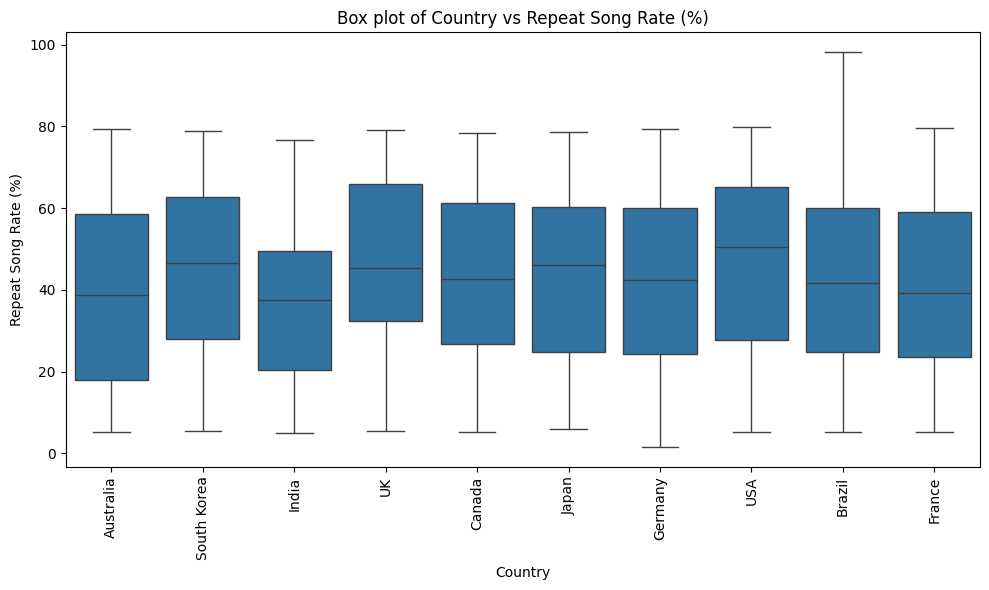

...

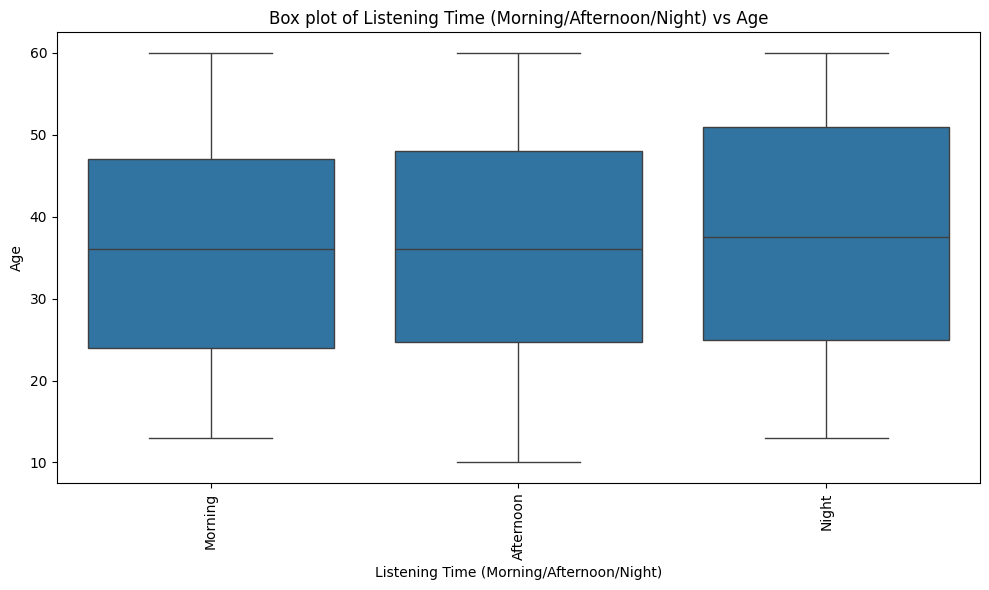

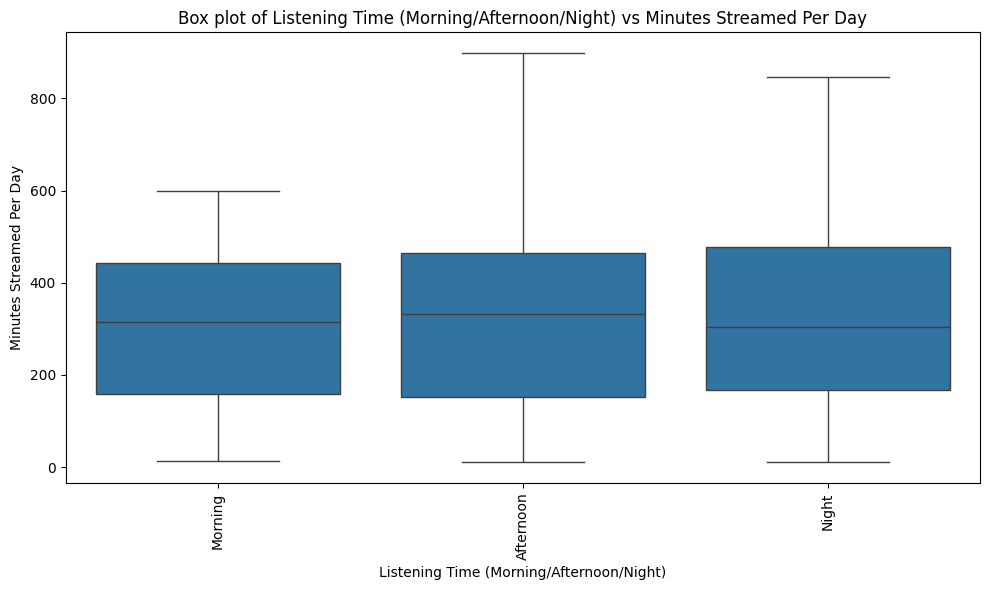

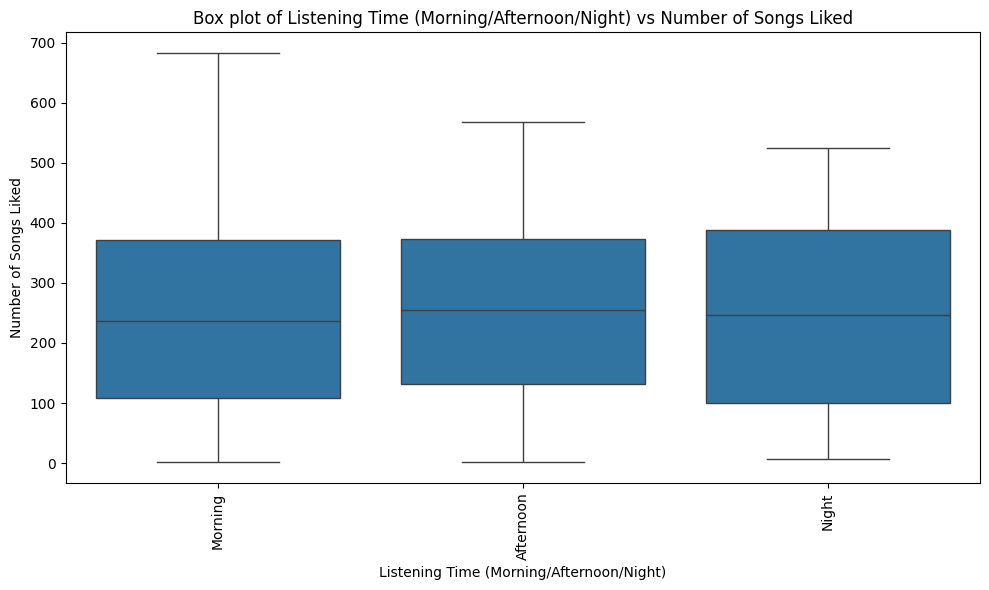

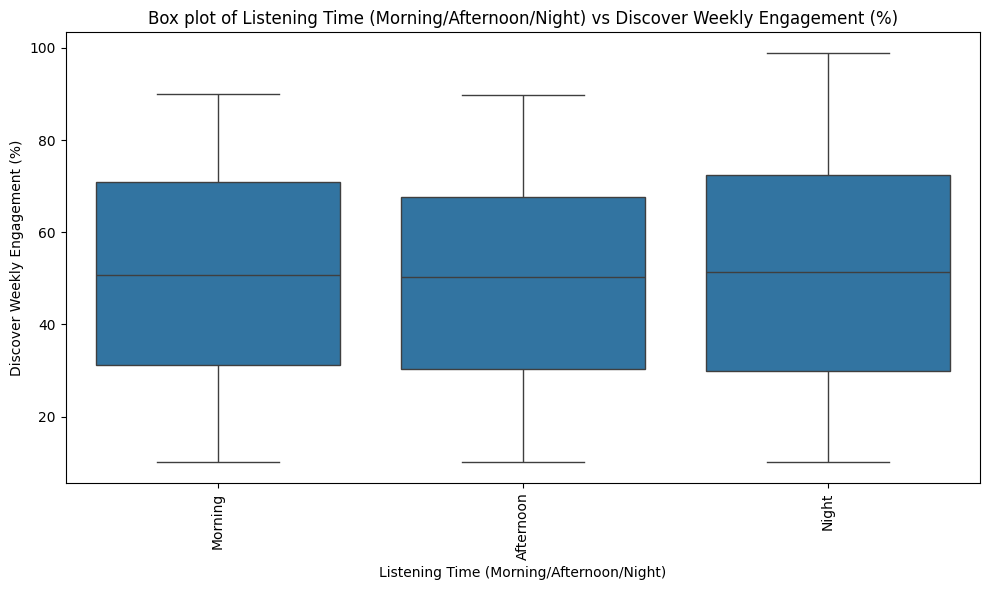

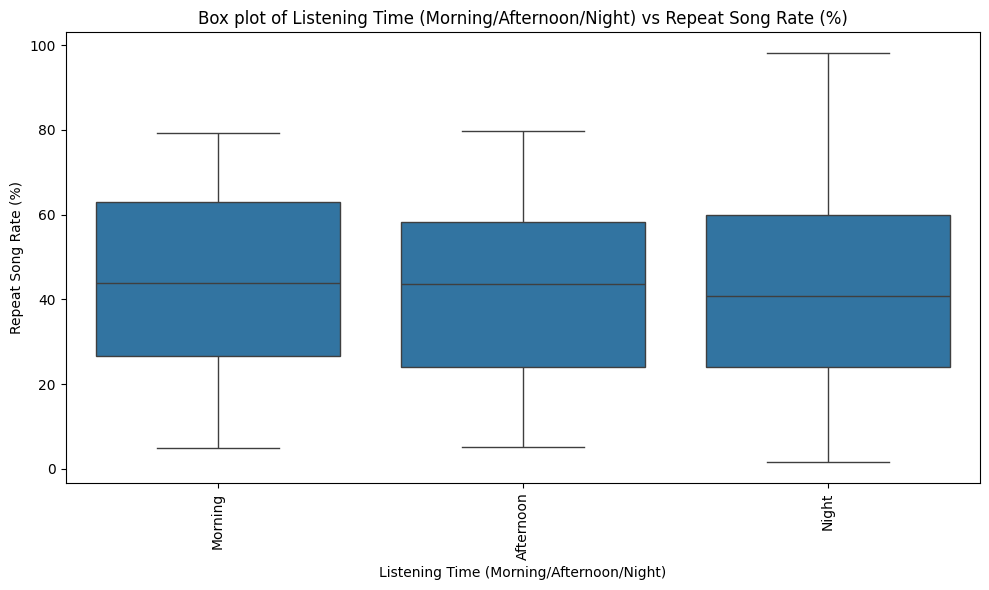

In [1307]:
#Box plots for categorical column and numerical column

plt.figure(figsize=(15, 10))
for i, col1 in enumerate(catcols):
    for j, col2 in enumerate(numcols):
        plt.figure(figsize=(10, 6))
        sns.boxplot(data=df, x=col1, y=col2)
        plt.title(f'Box plot of {col1} vs {col2}')
        plt.xticks(rotation=90)
        plt.tight_layout()
        plt.show()
        

### Bar plots (for Categorical vs. Categorical Data)

<Figure size 1500x1000 with 0 Axes>

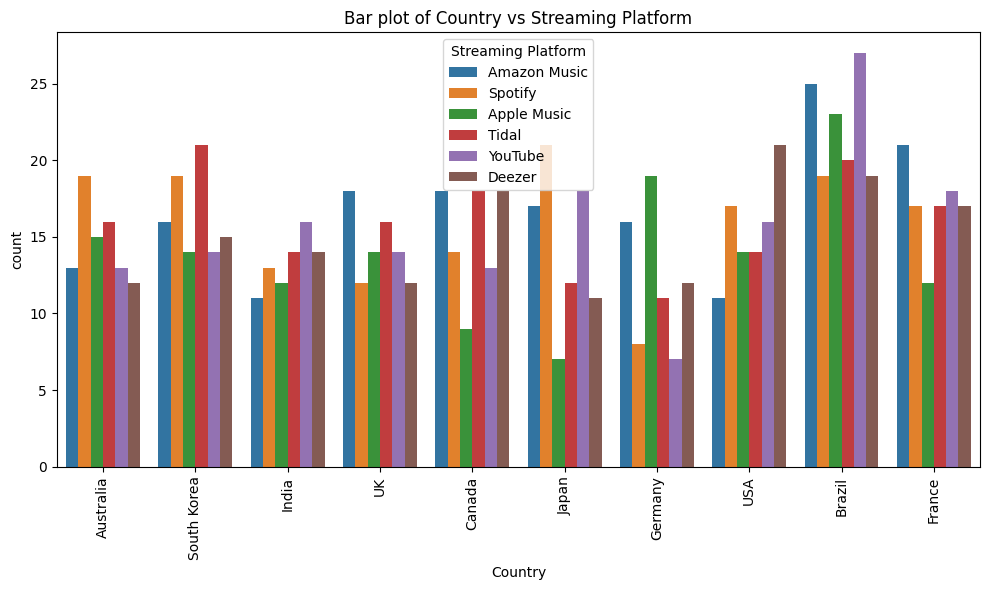

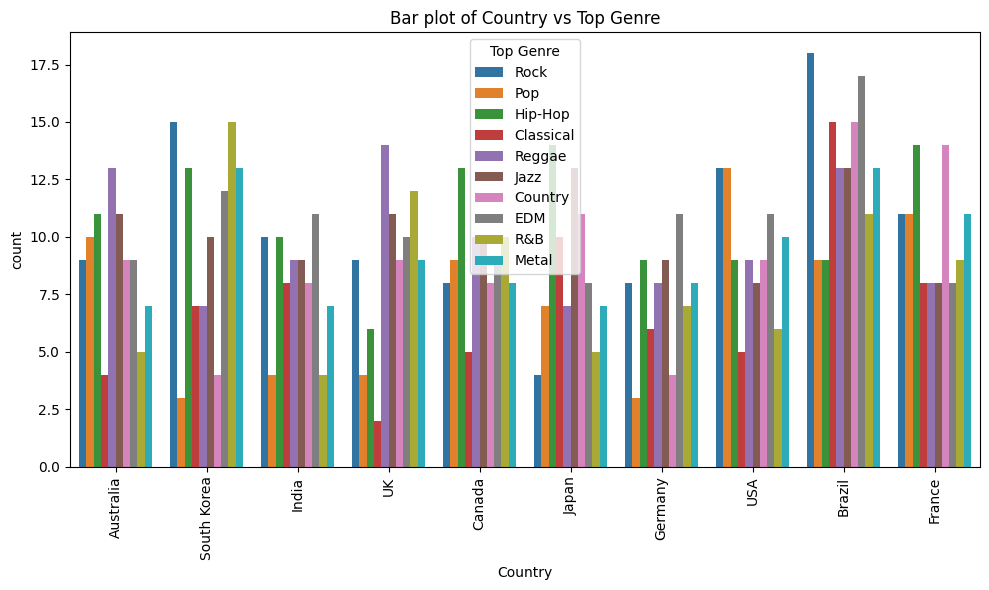

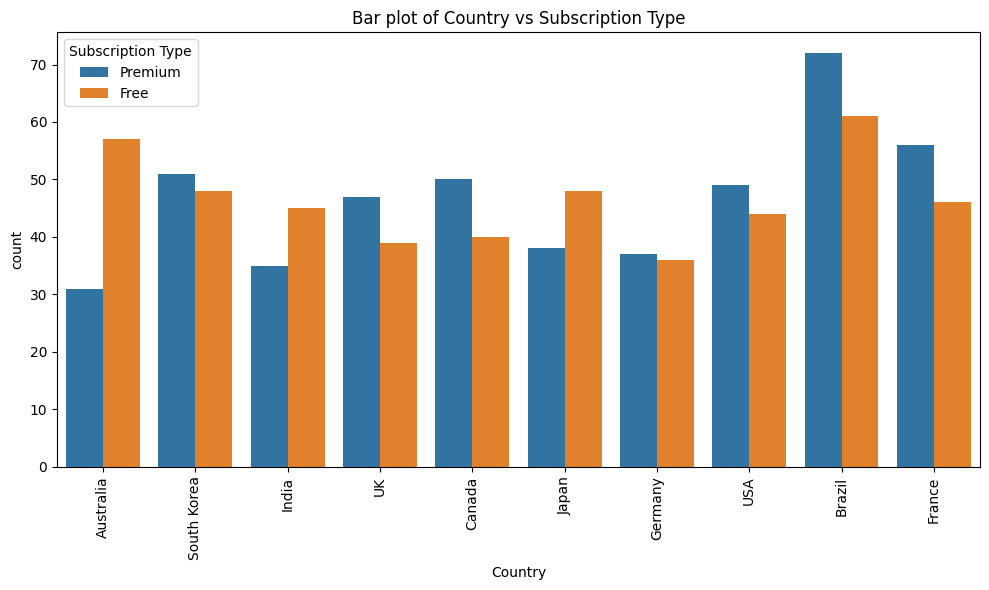

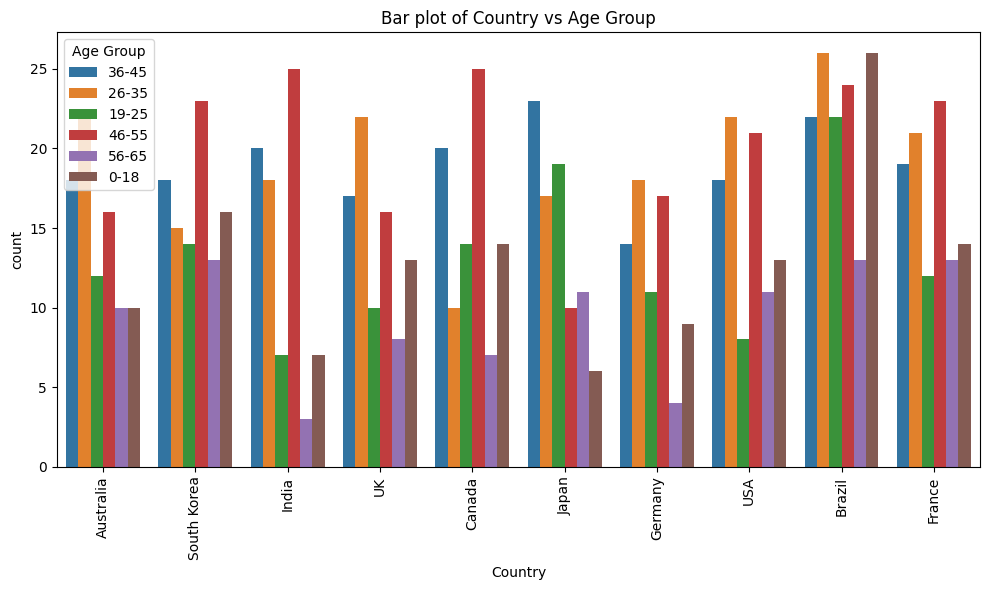

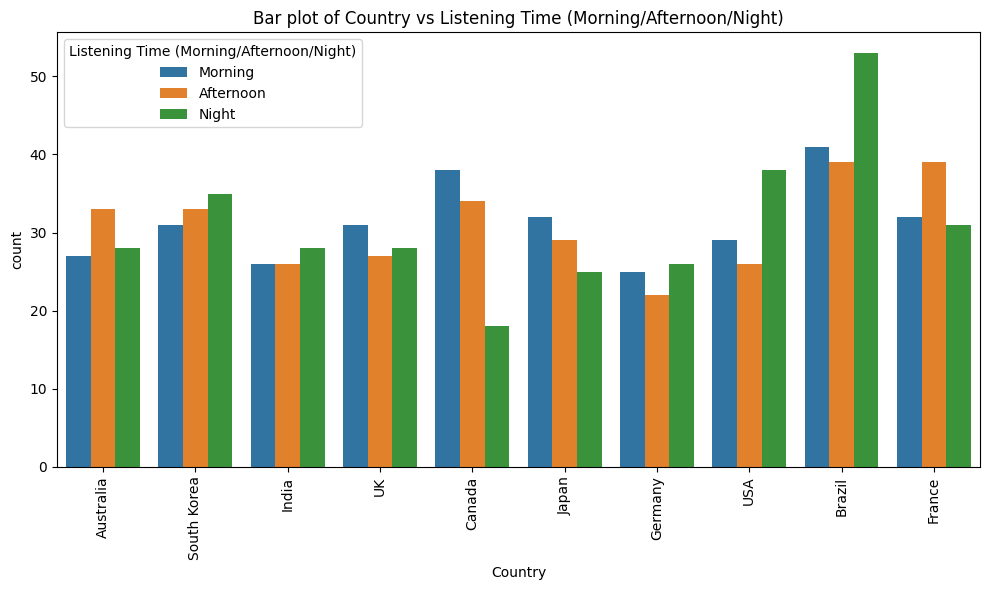

...

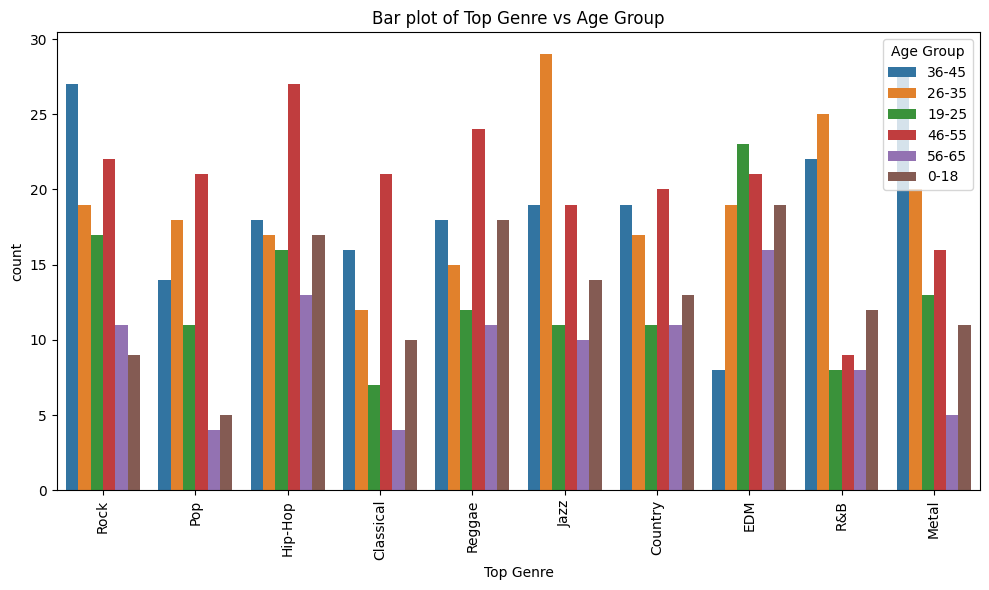

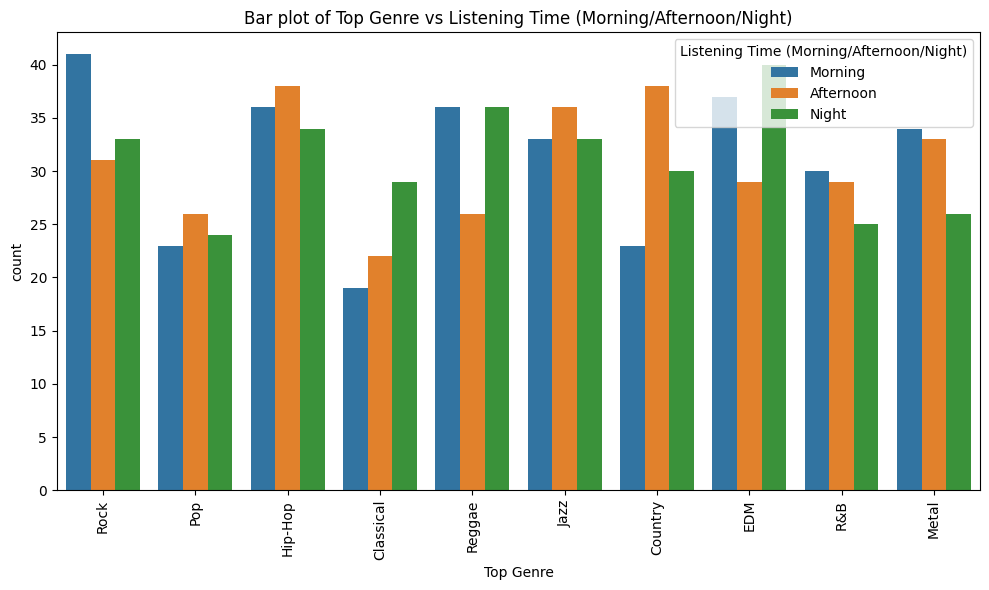

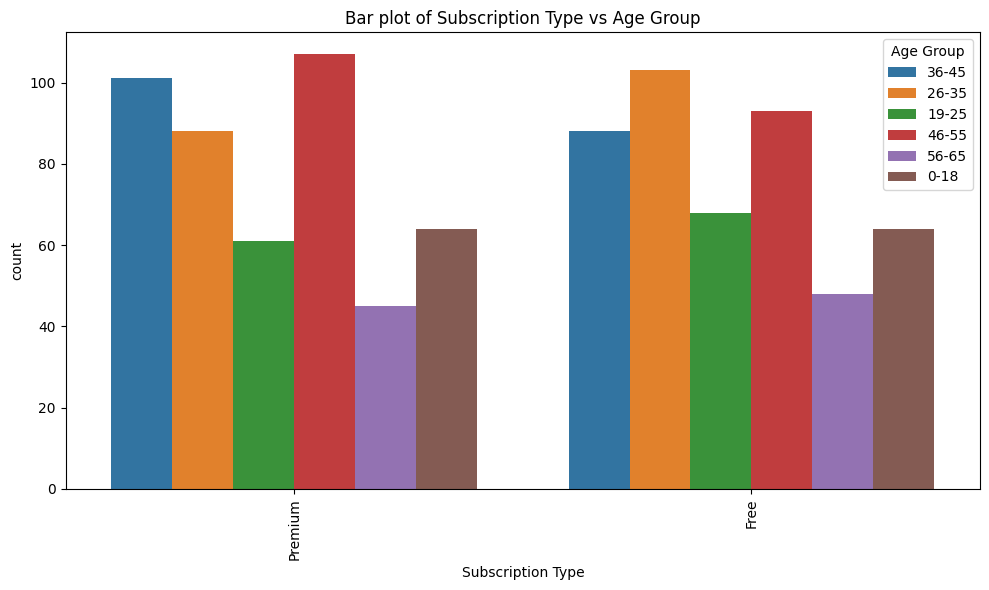

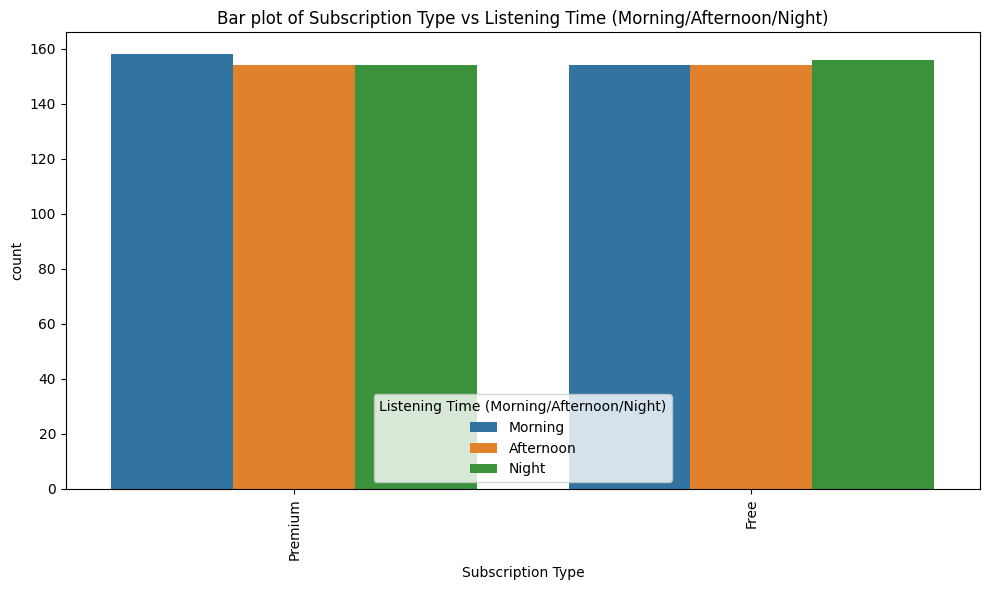

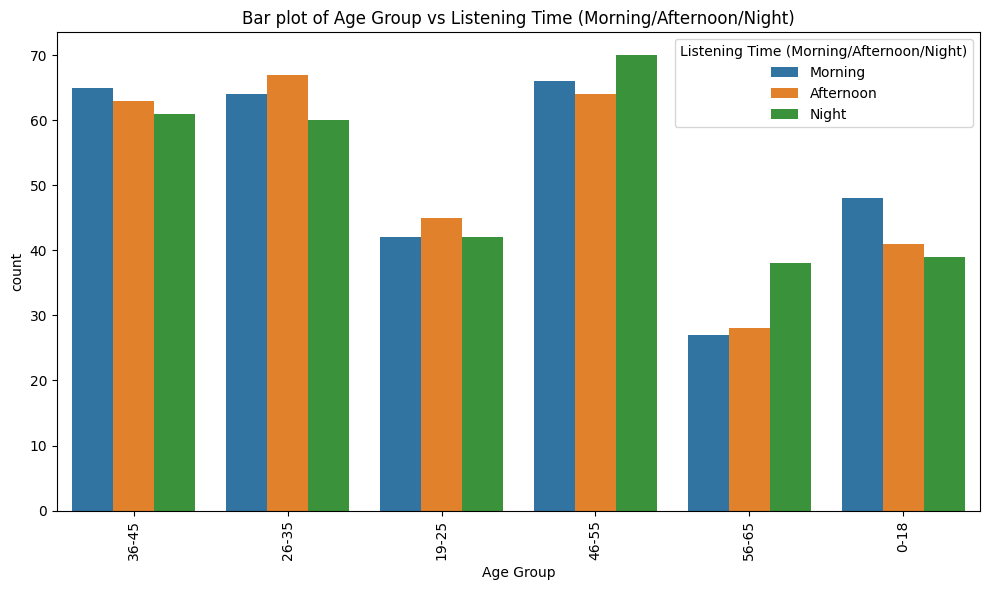

In [1308]:
### Bar plots for categorical columns
plt.figure(figsize=(15, 10))

for i, col1 in enumerate(catcols):
    for j, col2 in enumerate(catcols):
        if i < j:
            plt.figure(figsize=(10, 6))
            sns.countplot(data=df, x=col1, hue=col2)
            plt.title(f'Bar plot of {col1} vs {col2}')
            plt.xticks(rotation=90)
            plt.tight_layout()
            plt.show()

## Multivariate Analysis

#### Pairplot for Numerical Columns

##### These are overall pairplots, so no proper distinction between different categories

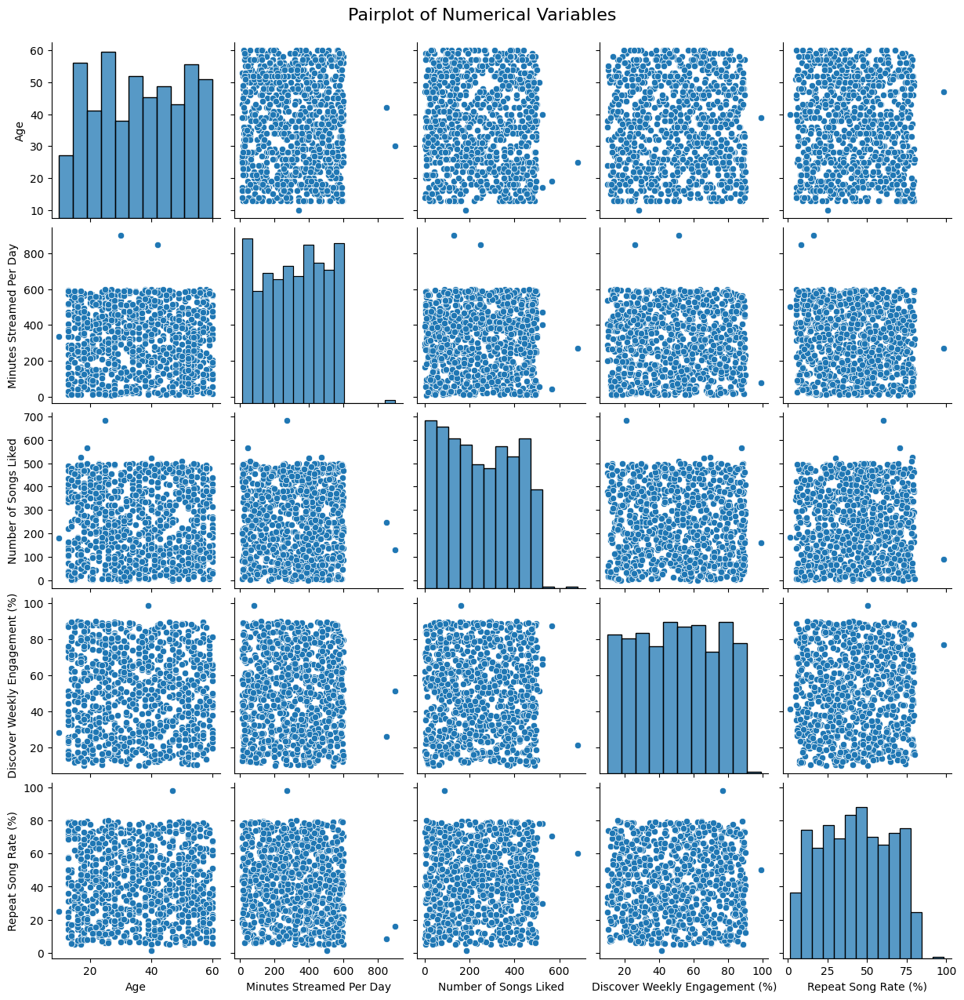

In [1309]:
sns.pairplot(df[numcols])
plt.suptitle("Pairplot of Numerical Variables", y=1.02, size=16)
plt.show()


## Better Visualization
#### Pairplot for Numerical Columns with Hue as a Categorical Column

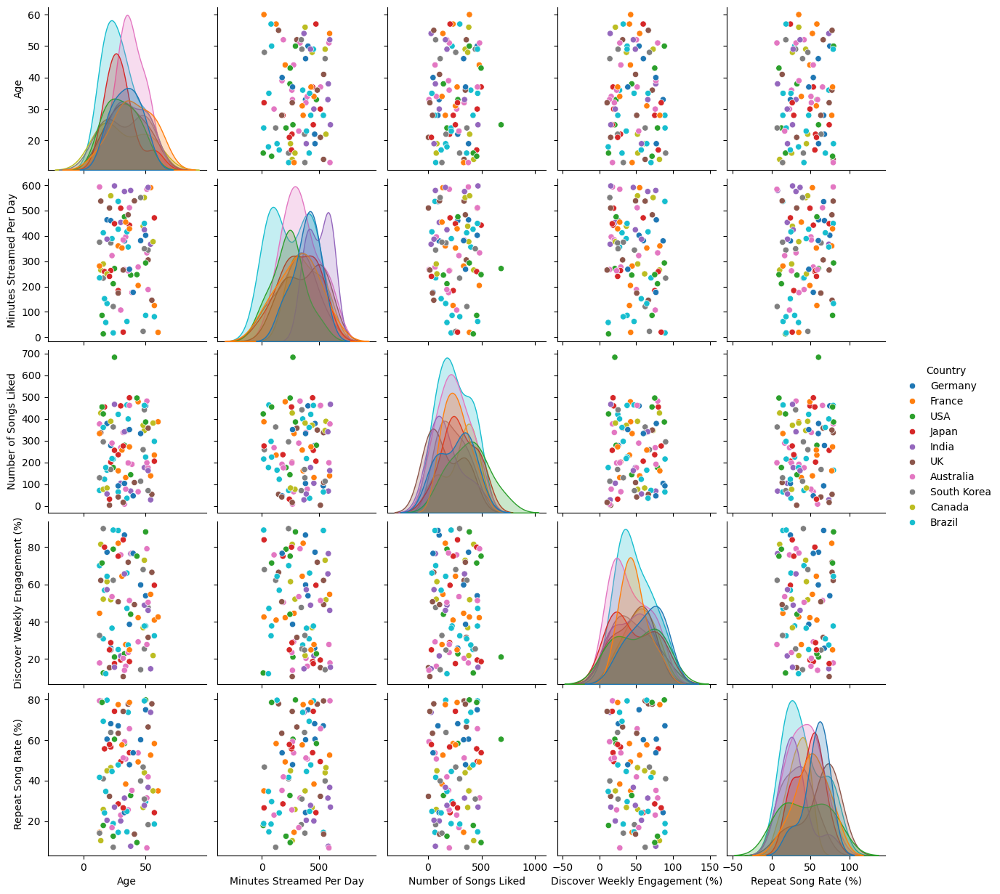

In [1310]:

sampled_df = df.sample(frac=0.1, random_state=42)
sns.pairplot(sampled_df, hue=sampled_df.select_dtypes(include=['object']).columns[1])
plt.show()

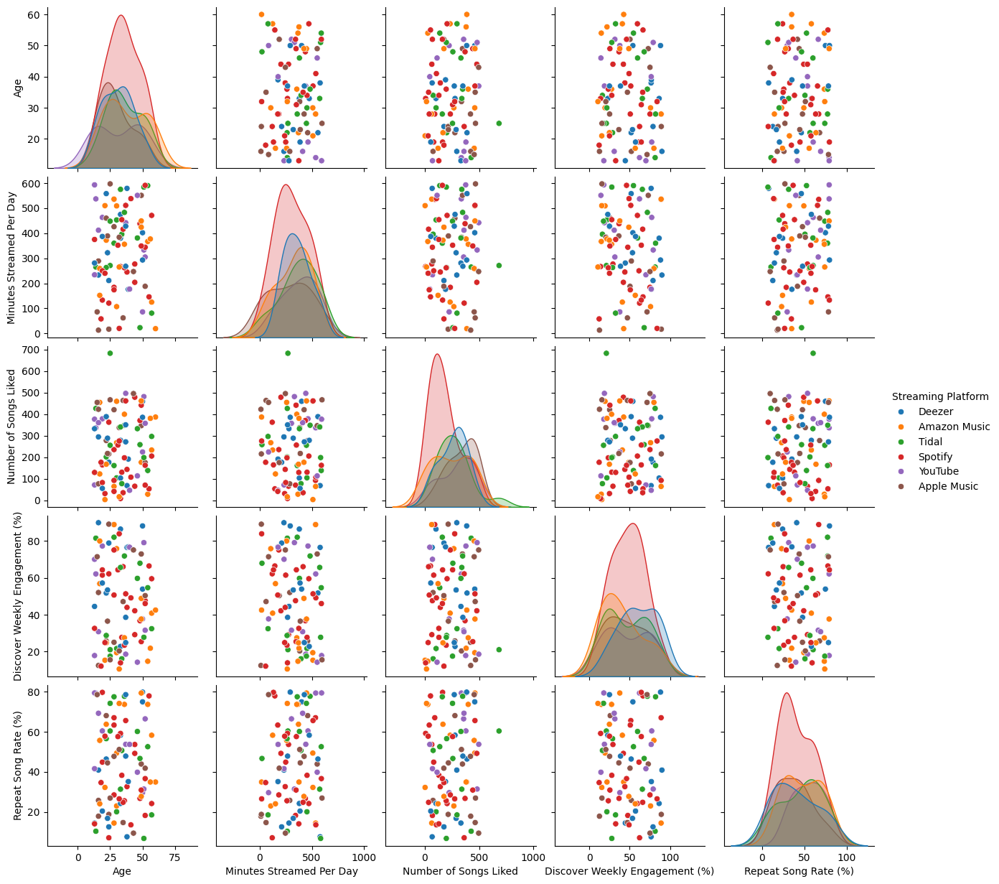

In [1311]:
sampled_df = df.sample(frac=0.1, random_state=42)
sns.pairplot(sampled_df, hue=sampled_df.select_dtypes(include=['object']).columns[2])
plt.show()

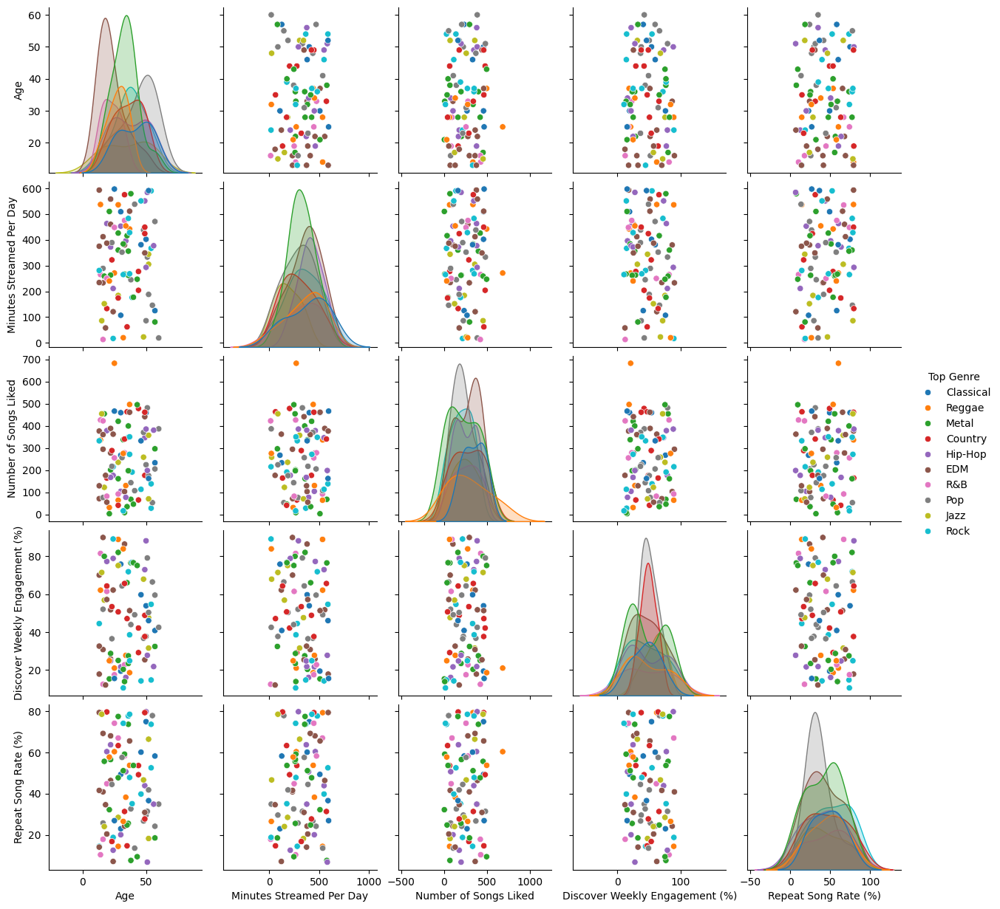

In [1312]:
sampled_df = df.sample(frac=0.1, random_state=42)
sns.pairplot(sampled_df, hue=sampled_df.select_dtypes(include=['object']).columns[3])
plt.show()

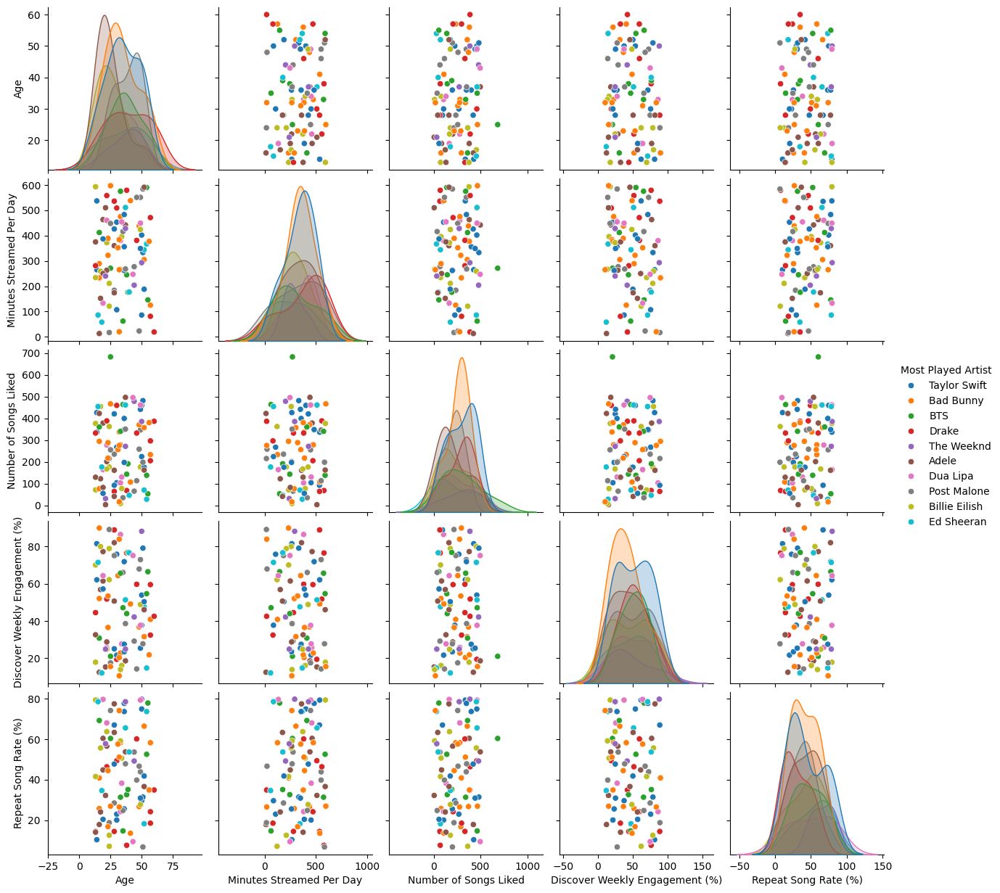

In [1313]:
sampled_df = df.sample(frac=0.1, random_state=42)
sns.pairplot(sampled_df, hue=sampled_df.select_dtypes(include=['object']).columns[4])
plt.show()

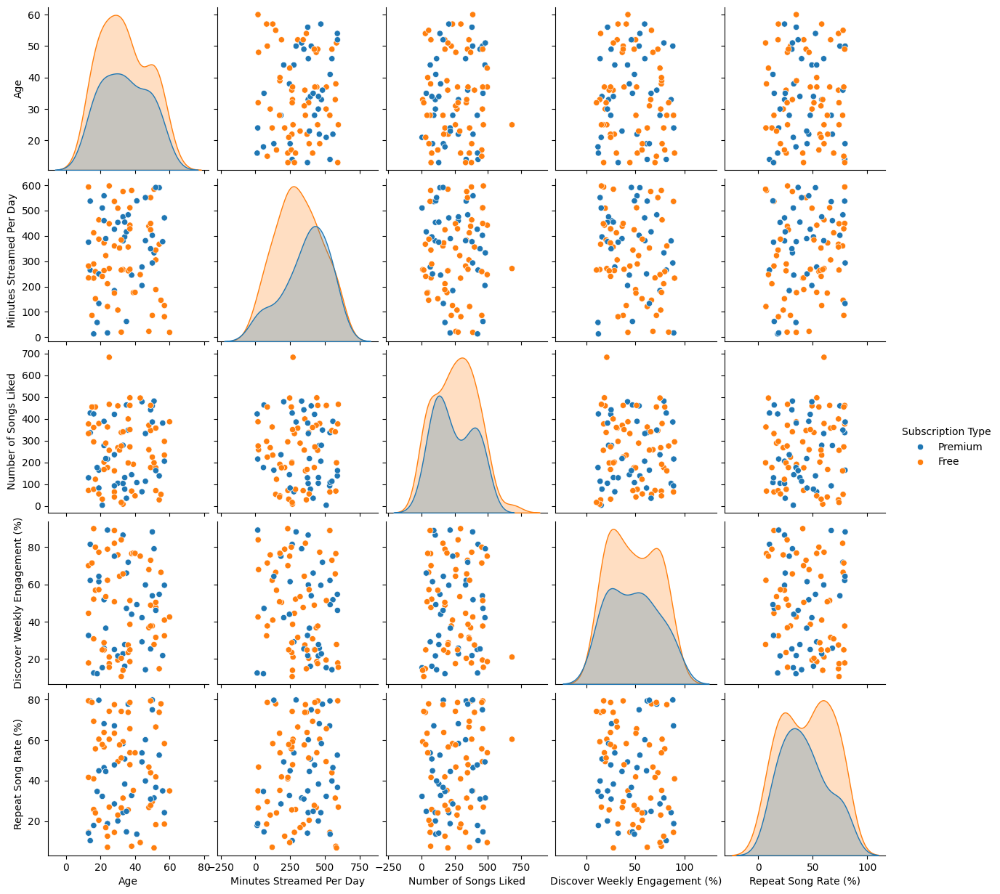

In [1314]:
sampled_df = df.sample(frac=0.1, random_state=42)
sns.pairplot(sampled_df, hue=sampled_df.select_dtypes(include=['object']).columns[5])
plt.show()

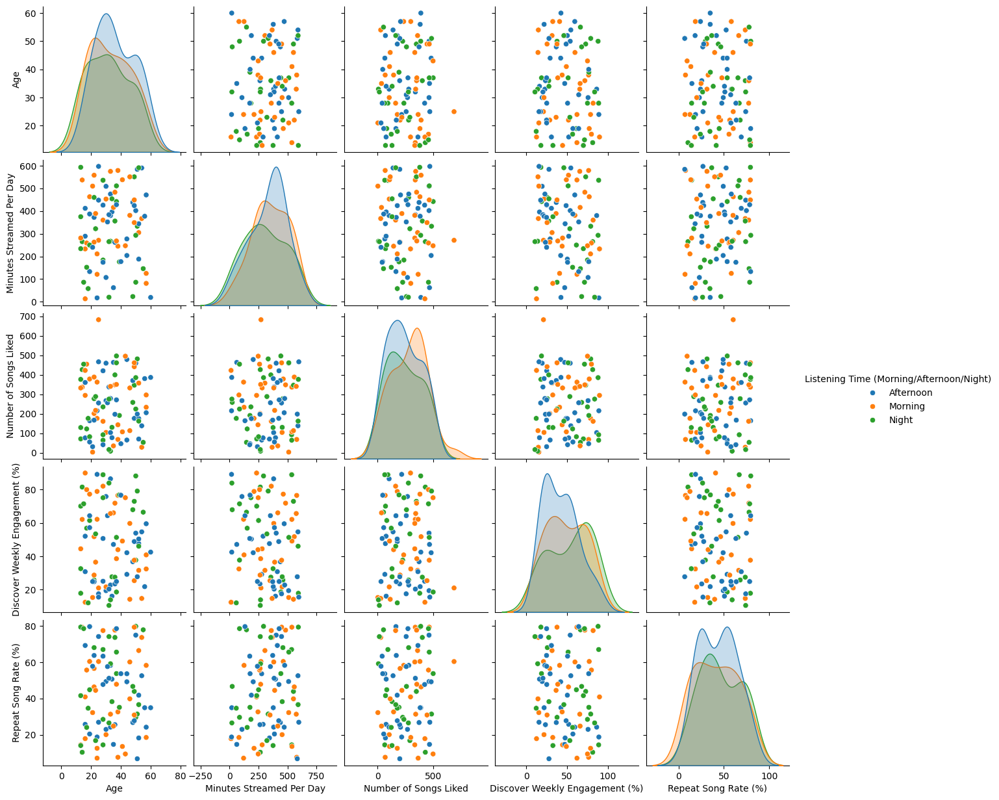

In [1315]:
sampled_df = df.sample(frac=0.1, random_state=42)
sns.pairplot(sampled_df, hue=sampled_df.select_dtypes(include=['object']).columns[6])
plt.show()

##### Correlation Matrix for numerical columns -> Multivariate analysis


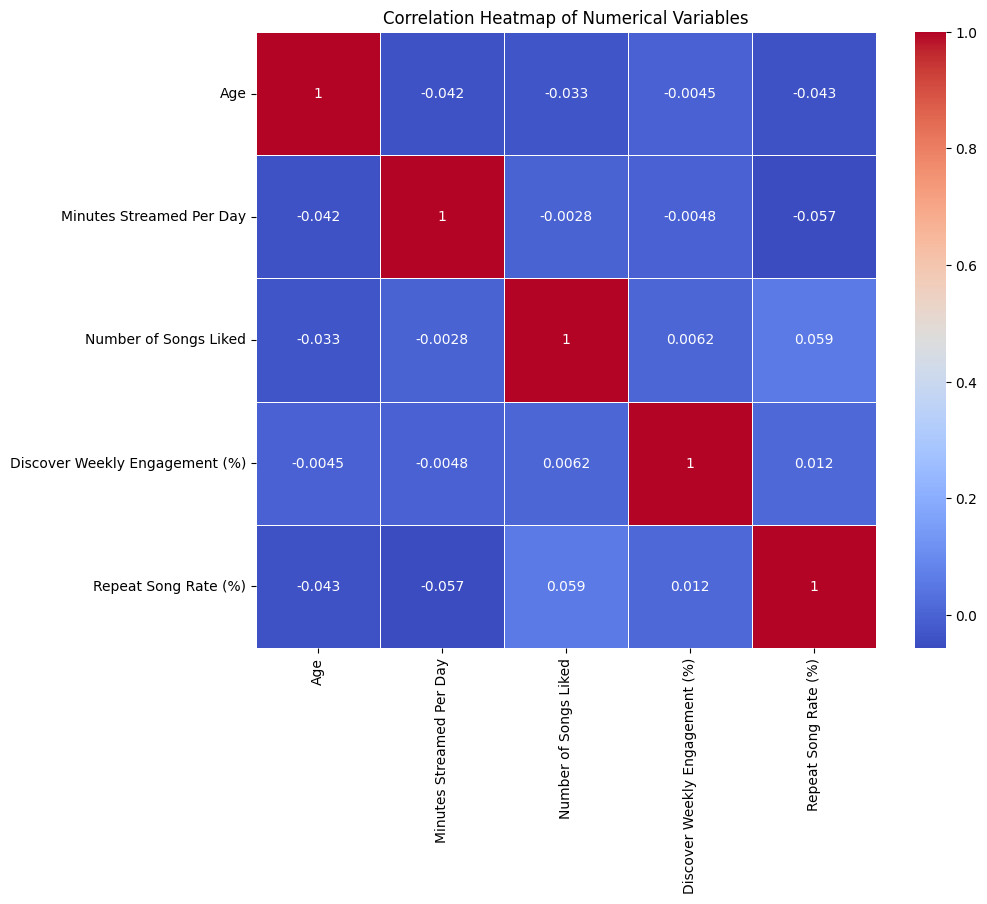

In [1316]:
plt.figure(figsize=(10, 8))
corr_matrix = df[numcols].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title("Correlation Heatmap of Numerical Variables")
plt.show()

## Grouped Comparisons
#### Very important for Music Companies to understand the data

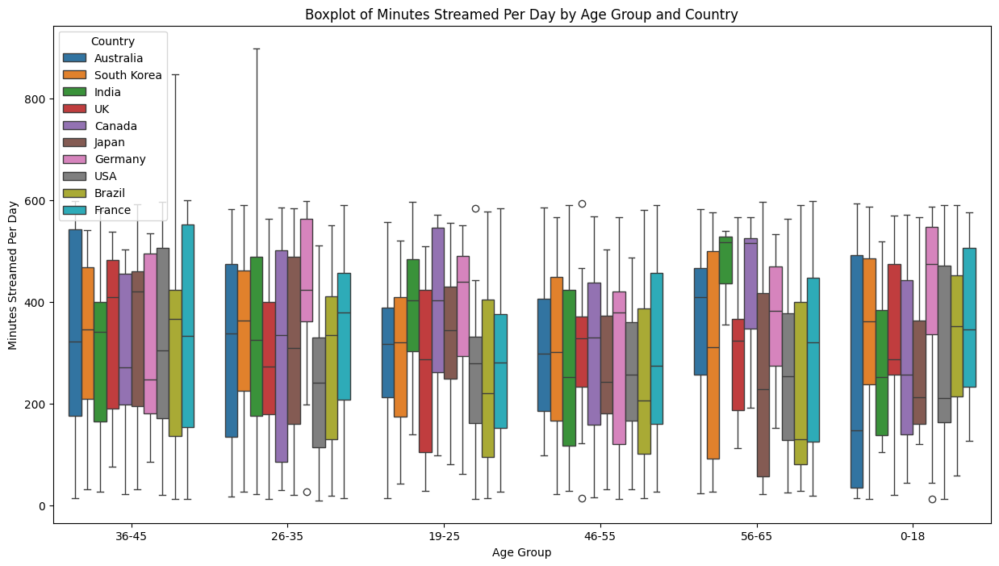

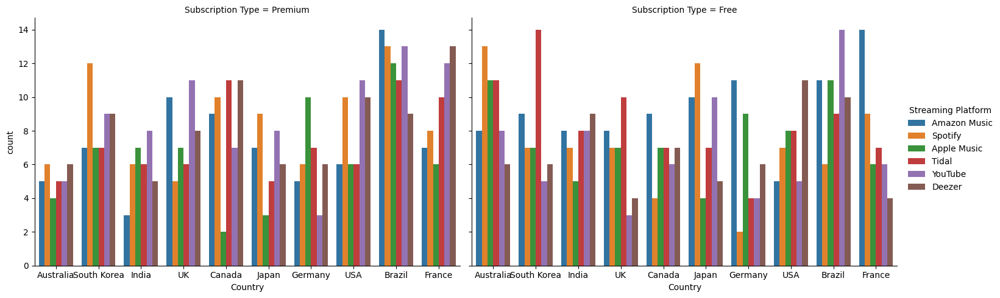

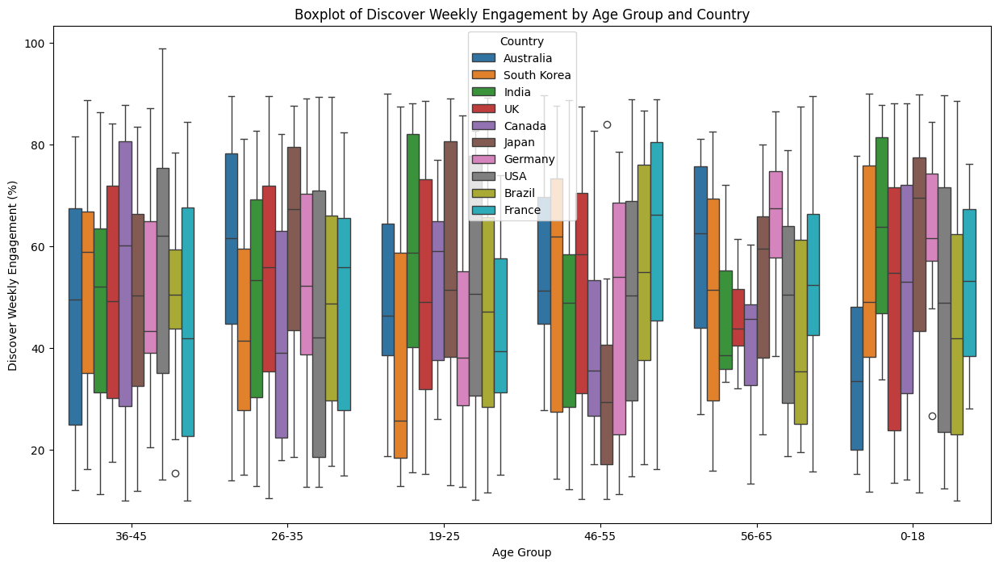

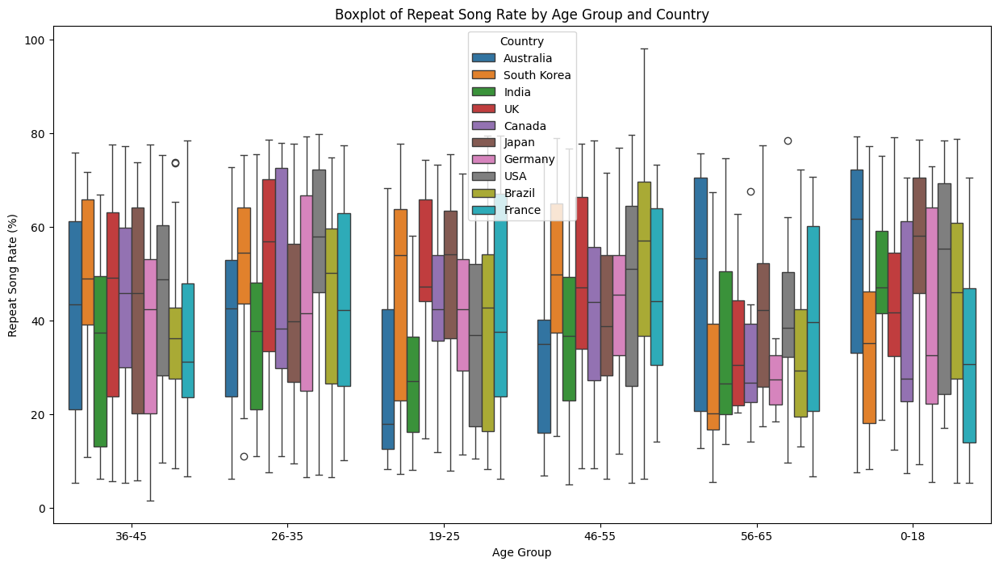

In [1317]:
# Minutes per day vs (Age Group and Country)
plt.figure(figsize=(15, 8))
sns.boxplot(data=df, x='Age Group', y='Minutes Streamed Per Day', hue='Country')
plt.title("Boxplot of Minutes Streamed Per Day by Age Group and Country")
plt.show()

# Stream Platform vs (Country and Subscription Type) -> all three are categorical columns
sns.catplot(
    data=df, x='Country', hue='Streaming Platform', col='Subscription Type',
    kind='count', height=5, aspect=1.5  # Adjust size
)
plt.show()


# Discover Weekly Engagement vs (Age Group and Country)
plt.figure(figsize=(15, 8))
sns.boxplot(data=df, x='Age Group', y='Discover Weekly Engagement (%)', hue='Country')
plt.title("Boxplot of Discover Weekly Engagement by Age Group and Country")
plt.show()

# Repeat Song Rate vs (Age Group and Country)
plt.figure(figsize=(15, 8))
sns.boxplot(data=df, x='Age Group', y='Repeat Song Rate (%)', hue='Country')
plt.title("Boxplot of Repeat Song Rate by Age Group and Country")
plt.show()


#### Save the cleaned data in a new csv file

In [1318]:
# save cleaned data to csv
df.to_csv('Cleaned_Global_Music_Streaming_Listener_Preferences.csv', index=False)
print("\nCleaned Data saved to 'Cleaned_Global_Music_Streaming_Listener_Preferences.csv' file.")


Cleaned Data saved to 'Cleaned_Global_Music_Streaming_Listener_Preferences.csv' file.


# That's it! Thanks.
##### 23114050 - Krish Singla (Computer Science and Engineering)
##### DAI-101 Tutorial 2